In [ ]:
import glob
import importlib
import numpy as np
import os
import matplotlib.pyplot as plt
from ntq import Exp_data_utils, config_utils, fit_el_utils, fit_pl_utils, plot_utils, covariance_utils, generate_data_utils
from ntq.model_function import *

os.chdir(r'./pl_temp_fit') 

PL data: ['/public5./pl_temp_fit/Bayes_data_norm/PM6Y6/PL/0.582.csv']
EL data: ['/public5./pl_temp_fit/Bayes_data_norm/PM6Y6/EL/5mA.csv', '/public5./pl_temp_fit/Bayes_data_norm/PM6Y6/EL/10mA.csv', '/public5./pl_temp_fit/Bayes_data_norm/PM6Y6/EL/2mA.csv']


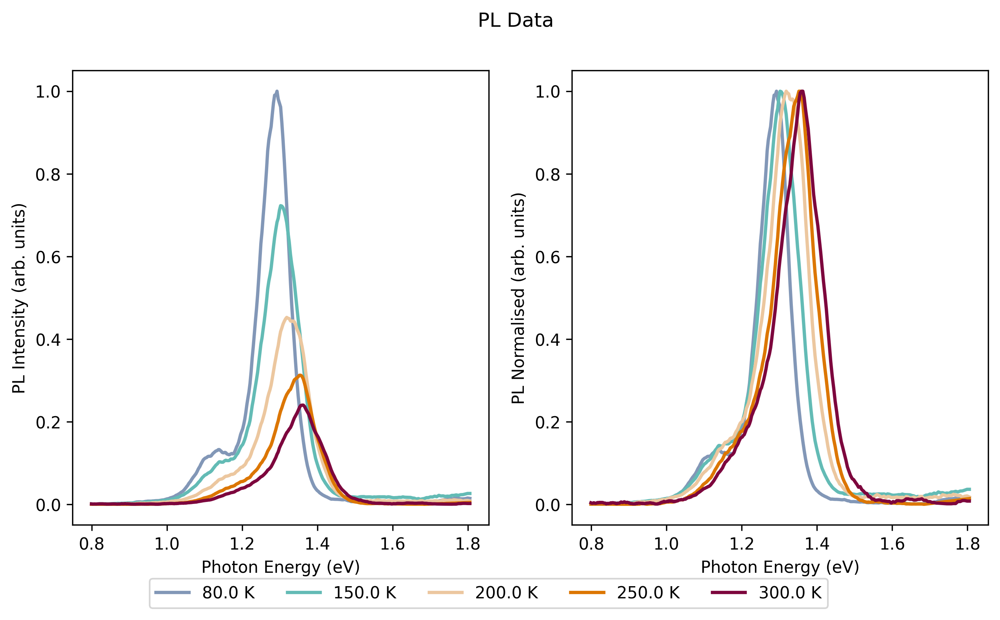

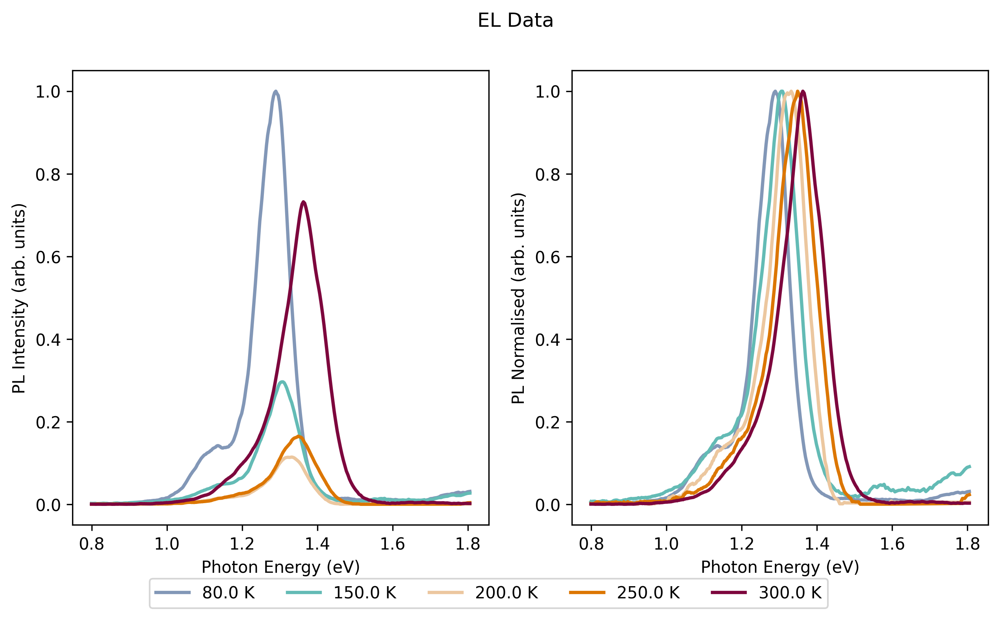

In [3]:
csv_files_pl = glob.glob('./pl_temp_fit/Bayes_data_norm/PM6Y6/PL/*.csv')
csv_files_pl = [path.replace('\\', '/') for path in csv_files_pl]
print("PL data:", csv_files_pl)
csv_files_el = glob.glob('./pl_temp_fit/Bayes_data_norm/PM6Y6/EL/*.csv')
csv_files_el = [path.replace('\\', '/') for path in csv_files_el]
print("EL data:", csv_files_el)

csv_name_pl=csv_files_pl[0]
csv_name_el=csv_files_el[0]

Exp_data_pl, temperature_list_pl, hws_pl = Exp_data_utils.read_data(csv_name_pl)
fig,ax = Exp_data_utils.plot_pl_data(Exp_data_pl, temperature_list_pl, hws_pl,title="PL Data")
Exp_data_el, temperature_list_el, hws_el = Exp_data_utils.read_data(csv_name_el)
fig,ax = Exp_data_utils.plot_pl_data(Exp_data_el, temperature_list_el, hws_el,title="EL Data")

In [4]:
# initialise parameters for the model

importlib.reload(config_utils)

(
    number_free_parameters,
    Temp_std_err,
    hws_std_err,
    relative_intensity_std_error_pl,
    relative_intensity_std_error_el,
    sigma,
) = (5, 10, 0.005, 0.05, 0.1, 0.001)
fixed_parameters_dict = {
    "EX":{},
    "CT":{'off':0},  
    "D":{},
}
params_to_fit_init = {
    "EX":{"E": 1.494, "offset": 0.2, "sigma": 0.022, "Li": 0.075, "Lo": 0.107, "hO": 0.158},
    "CT":{"Li": 0.076, "Lo": 0.104, "hO": 0.175, "log_fosc": -2.89},
    "D":{"log_kEXCT": 8.998, "RCTE": 1*10**(-0.001)}, 
}
min_bounds = {
    "EX":{"E": 1.3146, "offset": 0.17, "sigma": 0.0198, "Li": 0.0675, "Lo": 0.0963, "hO": 0.1422},
    "CT":{"E": 1.2146, "Li": 0.0684, "Lo": 0.0936, "hO": 0.1575, "log_fosc": -3},
    "D":{"log_kEXCT": 7, "RCTE": 1e-10},   
}
max_bounds = {
    "EX":{"E": 1.6834, "offset": 0.21,"sigma": 0.0242, "Li": 0.0825, "Lo": 0.1177, "hO": 0.1738},
    "CT":{"E": 1.5834, "Li": 0.0836, "Lo": 0.1144, "hO": 0.1925, "log_fosc": -1},
    "D":{"log_kEXCT": 10, "RCTE": 1},
}

# save the model config
model_config, test_id = config_utils.save_model_config(
    csv_name_pl,
    csv_name_el,
    Temp_std_err,
    hws_std_err,
    relative_intensity_std_error_pl,
    relative_intensity_std_error_el,
    temperature_list_pl,
    hws_pl,
    temperature_list_el,
    hws_el,
    sigma,
    fixed_parameters_dict,
    params_to_fit_init,
    min_bounds,
    max_bounds,
)

size of hw is (369,)
size of temperature_list is (5,)


In [5]:
model_config,model_config_save = config_utils.load_model_config(test_id)
fixed_parameters_dict, params_to_fit, min_bound, max_bound = config_utils.get_dict_params(model_config_save)
model_config['temperature_list_el'] = temperature_list_el
model_config['hws_el'] = hws_el
model_config['temperature_list_pl'] = temperature_list_pl
model_config['hws_pl'] = hws_pl
save_folder = model_config_save['save_folder']

shape of mean value plot is (369, 5)
shape of mean value plot is (369, 5)


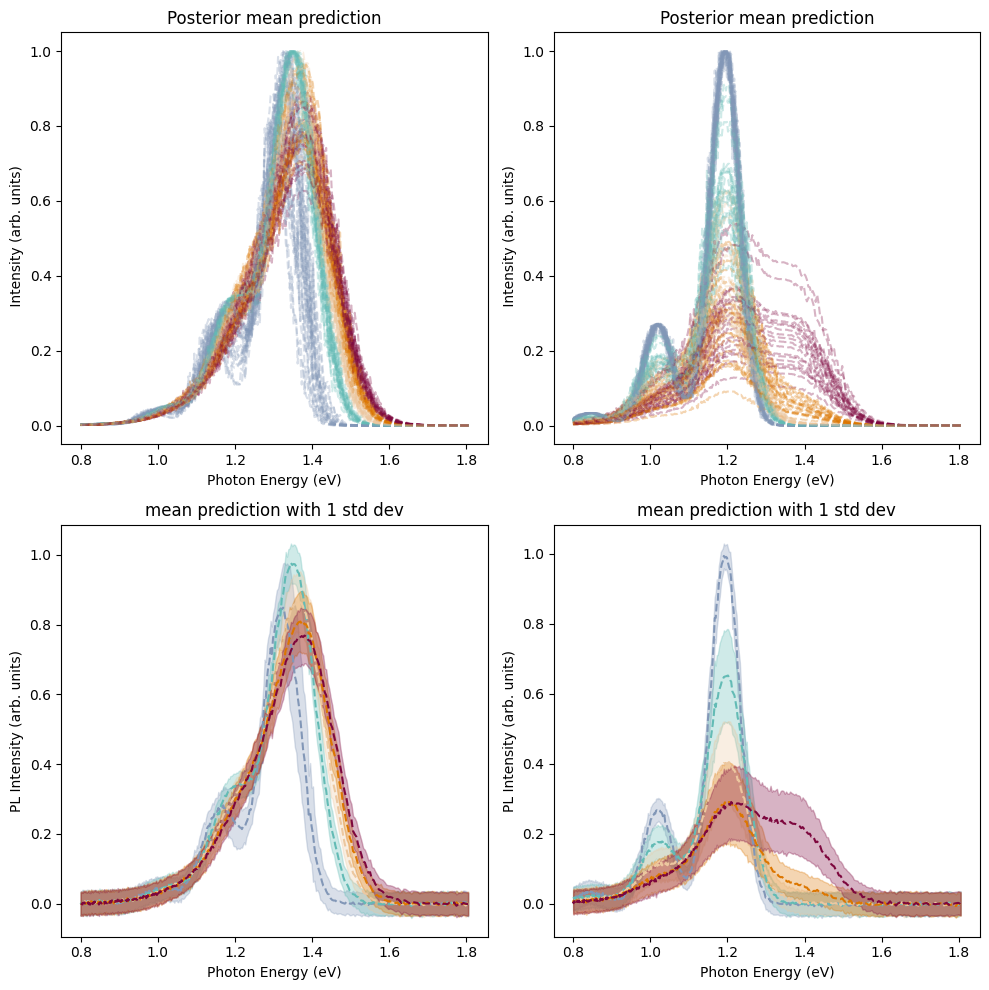

In [6]:
#%autoreload 2

import importlib
importlib.reload(generate_data_utils)
importlib.reload(covariance_utils)
#print(params_to_fit)
# get the variance of the data and plot it
co_var_mat_pl, co_var_mat_el, variance_el, variance_pl = (
    covariance_utils.plot_generated_data(
        save_folder,
        model_config,
        savefig=True,
        fixed_parameters_dict=fixed_parameters_dict,
        params_to_fit=params_to_fit_init,
    )
)


In [6]:

import importlib

importlib.reload(generate_data_utils)
importlib.reload(covariance_utils)
importlib.reload(fit_el_utils)

soln = fit_el_utils.get_maximum_likelihood_estimate(
    Exp_data_el,
    Exp_data_pl,
    co_var_mat_pl,
    co_var_mat_el,
    model_config,
    save_folder,
    num_coords=1,
    fixed_parameters_dict=fixed_parameters_dict,
    params_to_fit=params_to_fit_init,
    min_bound=min_bounds,
    max_bound=max_bounds,
)

running the minimisation
step 0


E:\Liming\OPVs\pl_temp_fit\src\pl_temp_fit\fit_el_utils.py:337: UserWarning: The figure layout has changed to tight
  fig.tight_layout(h_pad=0.0)
E:\Liming\OPVs\pl_temp_fit\src\pl_temp_fit\fit_el_utils.py:348: UserWarning: The figure layout has changed to tight
  fig.tight_layout(h_pad=0.0)


(<Figure size 2000x500 with 5 Axes>,
 array([<Axes: title={'center': 'temperature=80.0 K'}, xlabel='Photon Energy (eV)', ylabel='EL intensity'>,
        <Axes: title={'center': 'temperature=150.0 K'}, xlabel='Photon Energy (eV)', ylabel='EL intensity'>,
        <Axes: title={'center': 'temperature=200.0 K'}, xlabel='Photon Energy (eV)', ylabel='EL intensity'>,
        <Axes: title={'center': 'temperature=250.0 K'}, xlabel='Photon Energy (eV)', ylabel='EL intensity'>,
        <Axes: title={'center': 'temperature=300.0 K'}, xlabel='Photon Energy (eV)', ylabel='EL intensity'>],
       dtype=object))

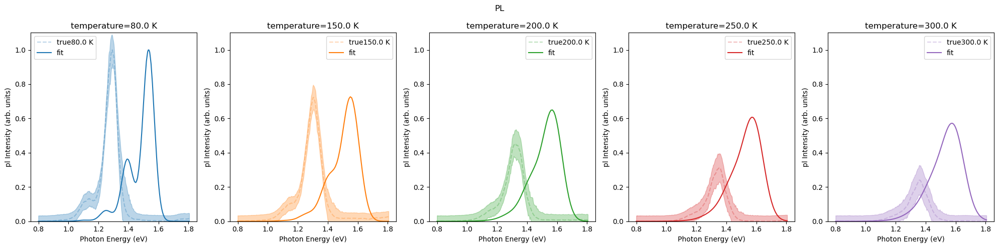

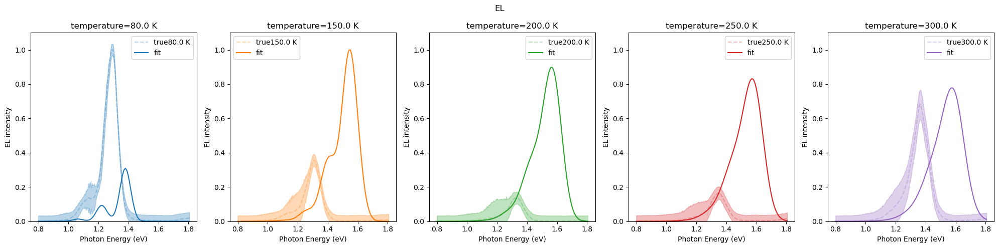

In [ ]:
importlib.reload(fit_el_utils)

true_parameters = fit_el_utils.get_param_dict(params_to_fit_init,soln.x)
fit_el_utils.plot_exp_data_with_variance(
    temperature_list_el,
    hws_el,
    temperature_list_pl,
    hws_pl,
    variance_el,
    variance_pl,
    save_folder,
    fixed_parameters_dict,
    true_parameters,
    Exp_data_pl,
    Exp_data_el,
)

shape of mean value plot is (369, 5)
shape of mean value plot is (369, 5)


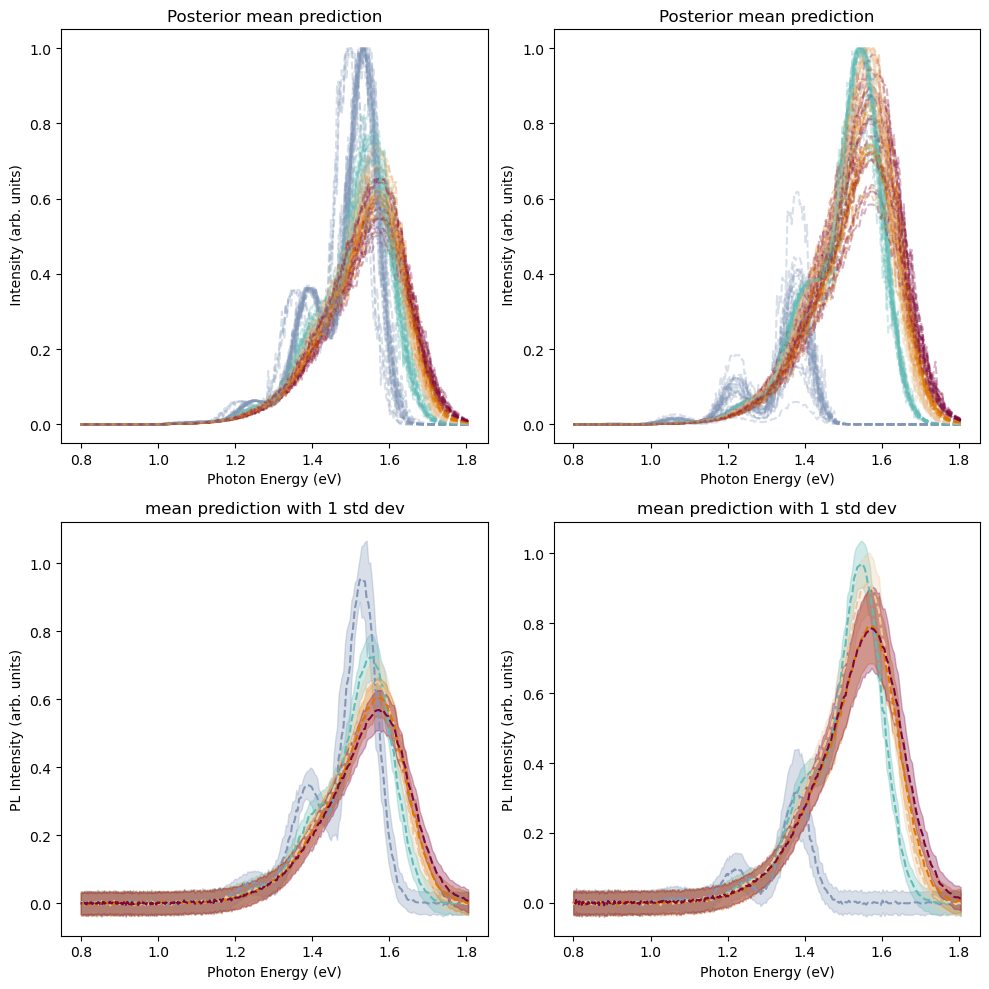

In [ ]:
co_var_mat_pl, co_var_mat_el, variance_el, variance_pl = (
    covariance_utils.plot_generated_data(
        save_folder,
        model_config,
        savefig=True,
        fixed_parameters_dict=fixed_parameters_dict,
        params_to_fit=true_parameters,
    )
)

In [ ]:

importlib.reload(generate_data_utils)
importlib.reload(covariance_utils)

fit_el_utils.run_sampler_single(
    save_folder,
    Exp_data_el,
    Exp_data_pl,
    co_var_mat_el,
    co_var_mat_pl,
    params_to_fit_init,
    fixed_parameters_dict,
    min_bounds,
    max_bounds,
    model_config,
    nsteps=5,
    coeff_spread=1,
    num_coords = 32,
)


Initial size: 0


  0%|          | 0/5 [00:00<?, ?it/s]c:\Users\kizam\.conda\envs\pl_temp_fit\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████| 5/5 [00:00<00:00, 108.70it/s]

single process took 0.1 seconds


## submitting jobs to the hpc


In [20]:
from ntq import Exp_data_utils
import numpy as np
import os
import matplotlib.pyplot as plt
import datetime
import os
import json
import uuid
import numpy as np
from ntq import config_utils
from ntq import covariance_utils, generate_data_utils, fit_el_utils
import importlib
import glob

name = 'D18Y5'
base_directory = './pl_temp_fit/'
os.chdir(base_directory)
directory_path = os.path.join(base_directory, 'Bayes_data_norm', name)
csv_files_pl = glob.glob(os.path.join(directory_path, 'PL', '*.csv'))
csv_files_el = glob.glob(os.path.join(directory_path, 'EL', '*.csv'))

print("PL data:", csv_files_pl)
print("EL data:", csv_files_el)

PL data: ['./pl_temp_fit/Bayes_data_norm/D18Y5/PL/0.518.csv', './pl_temp_fit/Bayes_data_norm/D18Y5/PL/0.557.csv', './pl_temp_fit/Bayes_data_norm/D18Y5/PL/0.582.csv']
EL data: ['./pl_temp_fit/Bayes_data_norm/D18Y5/EL/0.1mA.csv', './pl_temp_fit/Bayes_data_norm/D18Y5/EL/1mA.csv', './pl_temp_fit/Bayes_data_norm/D18Y5/EL/0.5mA.csv', './pl_temp_fit/Bayes_data_norm/D18Y5/EL/0.2mA.csv']


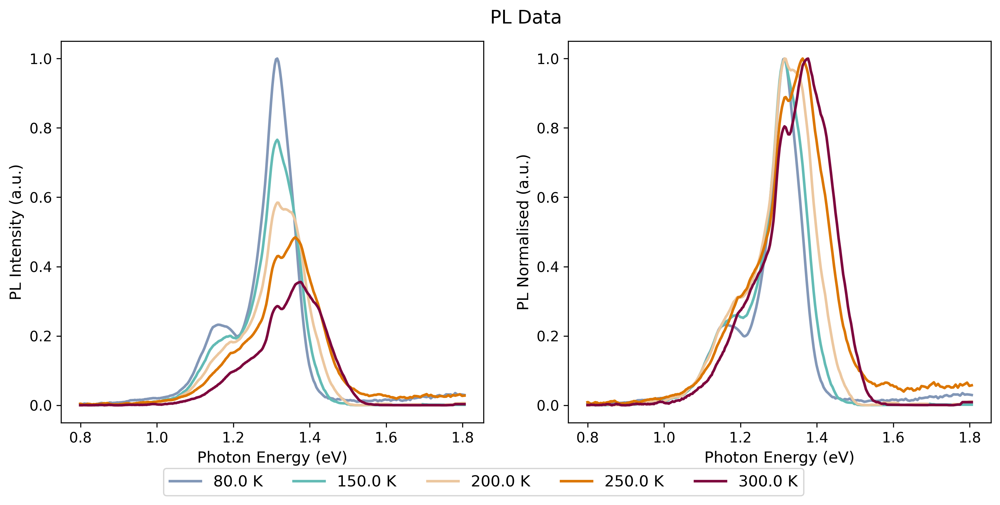

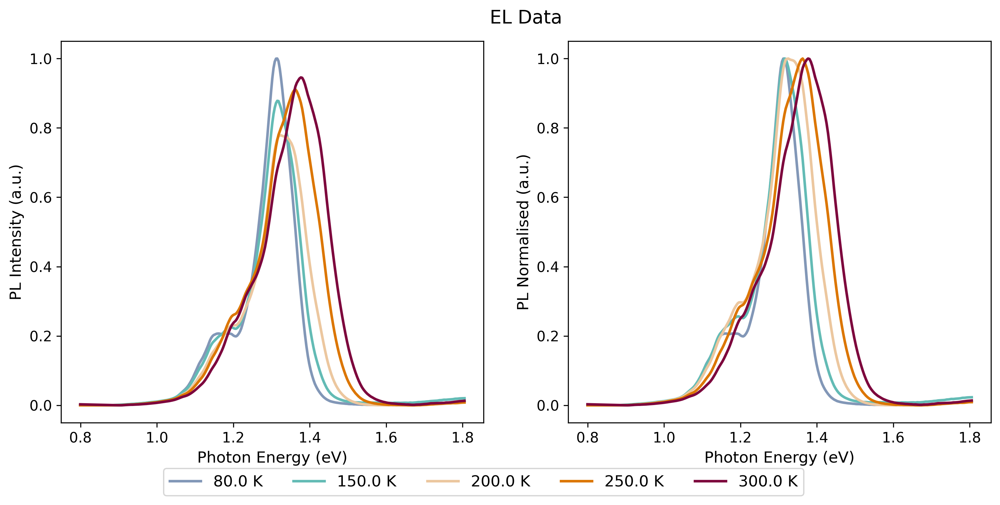

In [21]:
# plot EL and PL data
csv_name_pl=csv_files_pl[2]
csv_name_el=csv_files_el[1]
Exp_data_pl, temperature_list_pl, hws_pl = Exp_data_utils.read_data(csv_name_pl)
fig,ax = Exp_data_utils.plot_pl_data(Exp_data_pl, temperature_list_pl, hws_pl,title="PL Data")
Exp_data_el, temperature_list_el, hws_el = Exp_data_utils.read_data(csv_name_el)
fig,ax = Exp_data_utils.plot_pl_data(Exp_data_el, temperature_list_el, hws_el,title="EL Data")

In [31]:
# initialise parameters for the model

importlib.reload(config_utils)

(
    number_free_parameters,
    Temp_std_err,
    hws_std_err,
    relative_intensity_std_error_pl,
    relative_intensity_std_error_el,
    sigma,
) = (5, 10, 0.005, 0.05, 0.1, 0.001)
fixed_parameters_dict = {
    "EX":{},
    "CT":{'off':0},  
    "D":{},
}
params_to_fit_init = {
    "EX": {'E': 1.486, 'offset': 0.033, 'sigma': 0.024, 'Li': 0.079, 'Lo': 0.091, 'hO': 0.171},
    "CT": {'sigma': 0.022, 'Li': 0.078, 'Lo': 0.081, 'hO': 0.191, 'log_fosc': -0.421},
    "D": {'log_kEXCT': 8.126, 'RCTE': 1},
}
min_bounds = {
    "EX": {'E': 1.1888, 'offset': 0.0264, 'sigma': 0.0192, 'Li': 0.0632, 'Lo': 0.0728, 'hO': 0.1368},
    "CT": {'sigma': 0.0176, 'Li': 0.0624, 'Lo': 0.0648, 'hO': 0.1528, 'log_fosc': -0.8},
    "D": {'log_kEXCT': 7.9, 'RCTE': 0.01},
}
max_bounds = {
    "EX": {'E': 1.7832, 'offset': 0.0396, 'sigma': 0.0288, 'Li': 0.0948, 'Lo': 0.1092, 'hO': 0.2052},
    "CT": {'sigma': 0.0264, 'Li': 0.0936, 'Lo': 0.0972, 'hO': 0.2292, 'log_fosc': -0.45},
    "D": {'log_kEXCT': 8.3, 'RCTE': 1},
}

# save the model config
model_config, test_id = config_utils.save_model_config(
    csv_name_pl,
    csv_name_el,
    Temp_std_err,
    hws_std_err,
    relative_intensity_std_error_pl,
    relative_intensity_std_error_el,
    temperature_list_pl,
    hws_pl,
    temperature_list_el,
    hws_el,
    sigma,
    fixed_parameters_dict,
    params_to_fit_init,
    min_bounds,
    max_bounds,
)

size of hw is (369,)
size of temperature_list is (5,)


In [32]:
model_config_id = test_id
results_name = os.path.basename(directory_path.rstrip('/'))
sh_name = f"EMCEE_{results_name}"
print(sh_name) 
script="#!/bin/bash \n"+\
    "#SBATCH --time=167:59:01 \n"+\
    "#SBATCH --nodes=1 \n"+\
    "#SBATCH --ntasks-per-node=15 \n"+\
    "#SBATCH --partition=airs-cpu \n"+\
    "#SBATCH --error=%j.err \n"+\
    "#SBATCH --output=%j.out \n"+\
    " \n" + \
    "source ./miniconda3/etc/profile.d/conda.sh \n" + \
    "conda activate pl_temp_fit \n" + \
    "cd ./pl_temp_fit/ \n" + \
    f"python src/pl_temp_fit/scripts/run_EL_sampling.py --model_config_id {model_config_id} \n"
print(script) 

bash_script_dir = './pl_temp_fit/HPC_bash_script'
if not os.path.exists(bash_script_dir):
    os.makedirs(bash_script_dir)

cache_file_name = f"cache_{results_name}"
with open(os.path.join(bash_script_dir, sh_name), 'w') as f:
    f.write(script) 

slurm_script = f"sbatch --error={bash_script_dir}/{cache_file_name} --output={bash_script_dir}/{cache_file_name} {os.path.join(bash_script_dir, sh_name)}"
os.system(slurm_script)

EMCEE_D18Y5
#!/bin/bash 
#SBATCH --time=49:59:01 
#SBATCH --nodes=1 
#SBATCH --ntasks-per-node=15 
#SBATCH --partition=airs-cpu 
#SBATCH --error=%j.err 
#SBATCH --output=%j.out 
 
source ./miniconda3/etc/profile.d/conda.sh 
conda activate pl_temp_fit 
cd ./pl_temp_fit/ 
python src/pl_temp_fit/scripts/run_EL_sampling.py --model_config_id bdc5a52b-f712-4b07-afae-9c045a664e0e 

Submitted batch job 124249


0

In [25]:
!qstat -f -u yourname


ln01:
                                                                               Req'd  Req'd   Elap 
Job id               Username Queue    Name                 SessID NDS   TSK   Memory Time Use S Time 
-------------------- -------- -------- -------------------- ------ ----- ----- ------ ----- - -----
124231               22301014 airs-cpu EMCEE_D18Y5          --         1    15     -- 50:00 C 11:36
124236               22301014 airs-cpu merge                --         1    80     -- 168:0 R 00:56
124237               22301014 airs-cpu EMCEE_D18Y5          --         1    15     -- 50:00 R 00:00


In [489]:
!qstat -f | grep -A 10 "yourname"
# !sacct -u yourname --format=JobID,JobName%30,State,Partition,Account,AllocCPUS,ExitCode 

bash
scancel 22230760
squeue | grep 22230760

## analyse the results

In [1]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from ntq import Emcee_utils, config_utils, fit_el_utils, generate_data_utils, Exp_data_utils, covariance_utils

os.chdir(r'./pl_temp_fit') 
list_model_config=[]
json_files = glob.glob('fit_experimental_emcee_el/fit_data_base/*.json')
for id,json_file in enumerate(json_files):
    try:
        model_config, model_config_save = config_utils.load_model_config(json_file.split('/')[-1].replace('.json',''))
    except Exception as e:
        print(e)
        #if os.path.exists(json_file):
        #    os.remove(json_file)
        pass
    if os.path.exists(model_config_save['save_folder']+'/sampler.h5'):
        # print(id,json_file)
        
        filename = model_config_save['save_folder'] + "/sampler.h5"
        try: 
            reader = Emcee_utils.hDFBackend_2(filename, name="multi_core")
            distribution = reader.get_chain(flat=True)
        except:
            reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
            distribution = reader.get_chain(flat=True)
        
        true_parameters=list(np.mean(distribution,axis=0))
        model_config_save['mean'] = [f"{x:.3f}" for x in true_parameters]          
        model_config_save['num_iteration'] = reader.iteration  
        log_prob = reader.get_log_prob( flat=True)  
        model_config_save['max_log_prob'] = np.max(log_prob)
        list_model_config.append(model_config_save)
    #else:
            #os.remove(json_file)
           # for file in glob.glob(model_config_save['save_folder']+'/*'):
            #    os.remove(file)
            #os.rmdir(model_config_save['save_folder'])
import pandas as pd
df_all = pd.DataFrame(list_model_config)
# df_all

df_all['blend'] = df_all['csv_name_pl'].str.split('./pl_temp_fit/Bayes_data_norm/').str[-1]
columns_to_display = ['blend', 'date', 'test_id', 'num_iteration', 'max_log_prob']
df_selected = df_all.loc[:, columns_to_display]
# df_selected = df_all.query("date == '2025_02_28'")[columns_to_display]
styled_df = df_selected.style.set_properties(**{'text-align': 'left'}) \
                             .set_table_styles([{'selector': 'th', 'props': [('text-align', 'left')]}])
styled_df


[Errno 2] No such file or directory: 'fit_experimental_emcee_pl/fit_data_base//32dcc1a9-f94c-42e1-992d-f889c1e9618c.json'


NameError: name 'model_config_save' is not defined

(<Figure size 640x480 with 2 Axes>,
 array([<Axes: title={'center': 'Log Likelihood Histogram'}, xlabel='Log likelihood value', ylabel='Frequency'>,
        <Axes: title={'center': 'Log Likelihood vs Sampling Steps'}, xlabel='Sampling steps', ylabel='Log likelihood value'>],
       dtype=object))

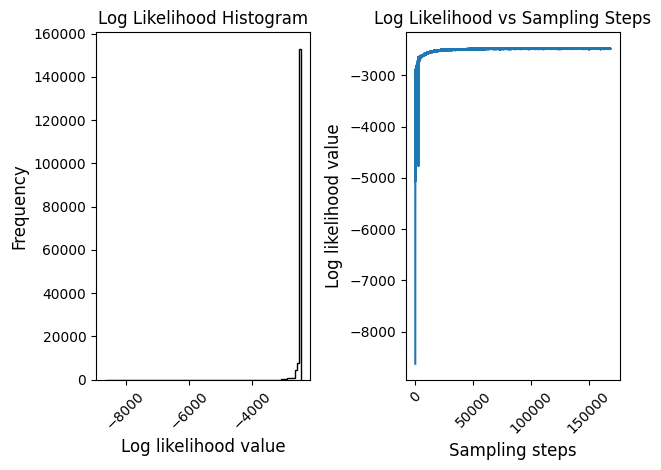

In [ ]:
def plot_log_likelihood(index, discard=1, save_svg=False):
    filename = df_all['save_folder'][index] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    flat_samples = reader.get_log_prob(discard=discard,flat=True)
    fig, axes = plt.subplots(1,2)
    flat_samples = flat_samples[flat_samples>-10e3]
    hist = axes[0].hist(flat_samples, 100, color="k", histtype="step")
    axes[0].set_title("Log Likelihood Histogram")
    axes[0].set_xlabel("Log likelihood value", fontsize=12)
    axes[0].set_ylabel("Frequency", fontsize=12)
    axes[0].tick_params(axis='x', rotation=45)
    axes[1].set_title("Log Likelihood vs Sampling Steps")
    axes[1].plot(np.arange(len(flat_samples)),flat_samples)
    axes[1].set_xlabel("Sampling steps", fontsize=12)
    axes[1].set_ylabel("Log likelihood value", fontsize=12)
    axes[1].tick_params(axis='x', rotation=45)
    fig.tight_layout()

    if save_svg:
        save_path = "./pl_temp_fit/bayes_params_results/D18Y5/"
        os.makedirs(save_path, exist_ok=True)
        svg_filename = save_path + f"log_likelihood_index{index}_discard{discard}.svg"
        fig.savefig(svg_filename, format='svg')
    
    return fig, axes

plot_log_likelihood(0, discard=0, save_svg=True)

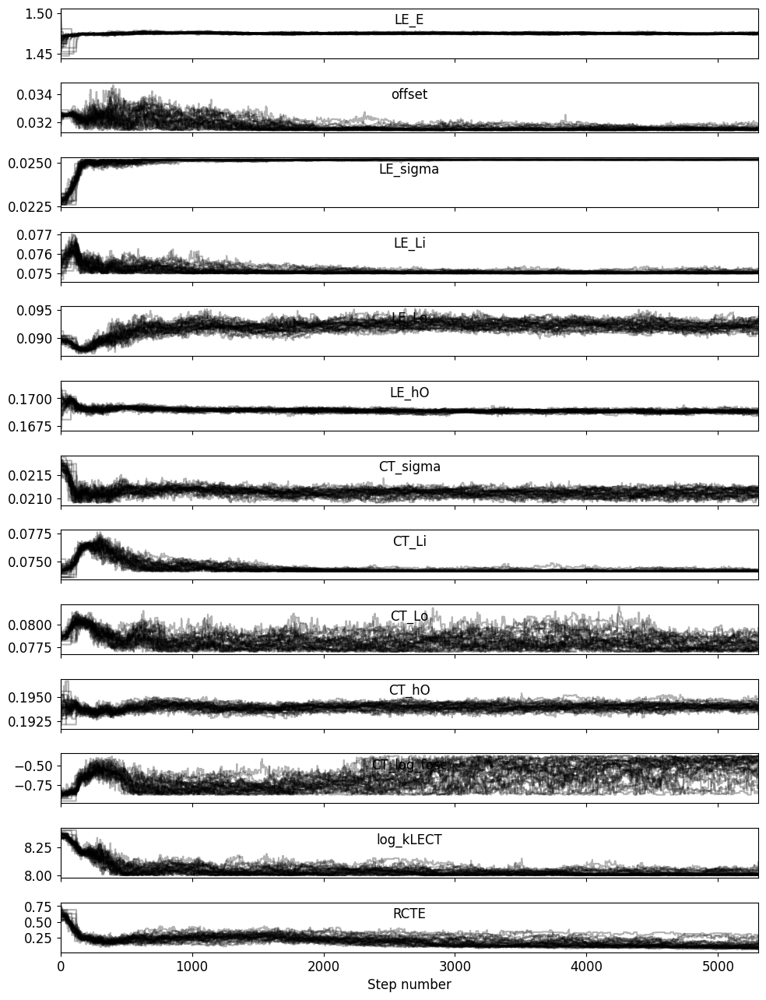

In [ ]:
def plot_chains(id):
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain()

    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']
    
    ndim = len(labels)
    fig, axes = plt.subplots(ndim, figsize=(10, ndim * 1), sharex=True)
    plt.rcParams['font.size'] = 12
    plt.rcParams['savefig.dpi'] = 600 

    for i in range(ndim):
        ax = axes[i]
        ax.plot(samples[:, :, i], "k", alpha=0.3) 
        ax.set_xlim(0, len(samples))
        ax.set_ylabel('')

        ax.set_title(labels[i], fontsize=12, y=0.55)
        ax.yaxis.set_label_coords(-0.1, 0.5)

    axes[-1].set_xlabel("Step number", fontsize=12)
    fig.tight_layout()
    fig.show()

plot_chains(0)

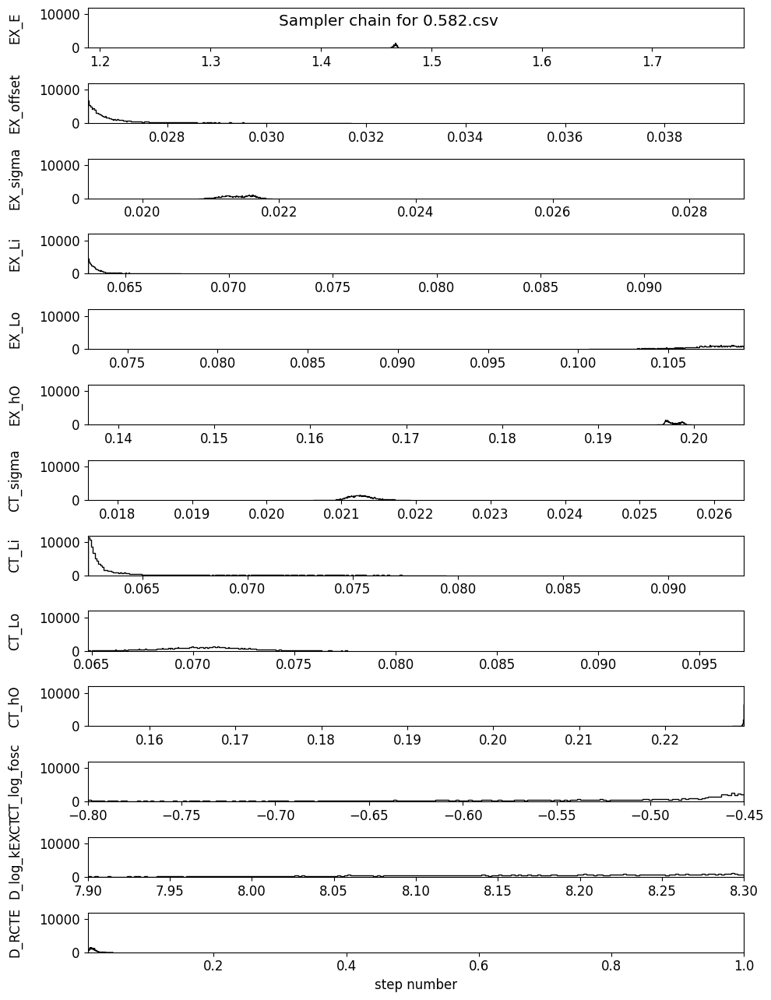

In [ ]:
def plot_distribution(id,discard = 0):
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain(discard=discard,flat=True)
    labels=[]
    min_bound,max_bound = [],[]
    params_to_fit = df_all['params_to_fit_init'][id]
    for key in params_to_fit.keys():
        for keys in params_to_fit[key].keys():
            labels.append(f"{key}_{keys}")
            min_bound.append(df_all['min_bounds'][id][key][keys])
            max_bound.append(df_all['max_bounds'][id][key][keys])
    ndim = len(labels)
    fig, axes = plt.subplots(ndim, figsize=(10, ndim*1),sharey=True)
    for i in range(ndim):
        ax = axes[i]
        ax.hist(samples[:, i], 200, color="k", histtype="step")
        ax.set_ylabel(labels[i])
        ax.yaxis.set_label_coords(-0.1, 0.5)
        ax.set_xlim(min_bound[i],max_bound[i])
    axes[-1].set_xlabel("step number")
    fig.tight_layout()
    fig.suptitle(f"Sampler chain for {df_all['csv_name_pl'][id].split('/')[-1]}")

    fig.show()
plot_distribution(4,discard=4000)

./pl_temp_fit/Bayes_data_norm/D18Y5/PL/0.582.csv
Random selected sample number: 25403 (Total samples: 41920)


({'EX': {'E': 1.4741803919807845,
   'offset': 0.026829383312601512,
   'sigma': 0.021661942659731648,
   'Li': 0.07848211547069207,
   'Lo': 0.1087318279048578,
   'hO': 0.19745348559829878},
  'CT': {'sigma': 0.020791829447007543,
   'Li': 0.06351102115495474,
   'Lo': 0.08738006353748111,
   'hO': 0.2250576354956826,
   'log_fosc': -0.7045713127330954},
  'D': {'log_kEXCT': 8.231251906291536, 'RCTE': 0.05868831616022113}},
 25403)

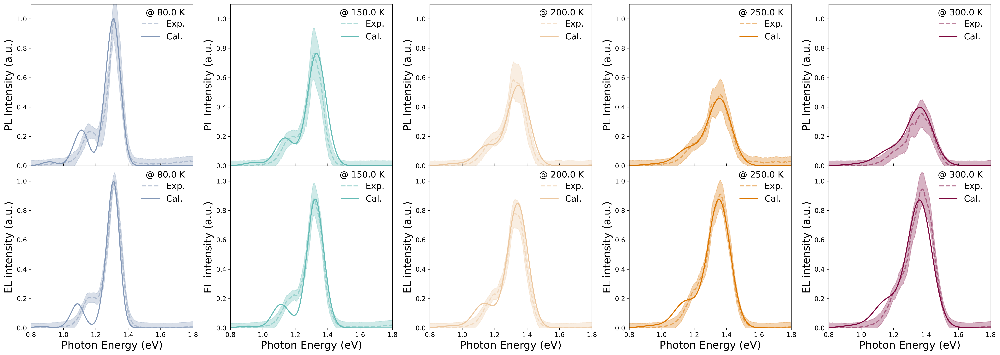

In [ ]:
import importlib
importlib.reload(fit_el_utils)
importlib.reload(generate_data_utils)
def plot_fit_results(id,discard=0):
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    csv_name_pl = df_all['csv_name_pl'][id]
    print(f"{csv_name_pl}")
    Exp_data_pl, temperature_list_pl, hws_pl = Exp_data_utils.read_data(df_all['csv_name_pl'][id])
    Exp_data_el, temperature_list_el, hws_el = Exp_data_utils.read_data(df_all['csv_name_el'][id])
    sample = reader.get_chain(discard=discard,flat=True)
    sample_num = np.random.randint(0, sample.shape[0])
    print(f"Random selected sample number: {sample_num} (Total samples: {sample.shape[0]})")
    data_fit = sample[sample_num,:]
    true_parameters = fit_el_utils.get_param_dict(df_all['params_to_fit_init'][id],data_fit)
    csv_name_el =df_all['csv_name_el'][id]
    csv_name_pl = df_all['csv_name_pl'][id]
    Exp_data_pl, temperature_list_pl, hws_pl = Exp_data_utils.read_data(
        csv_name_pl
    )
    Exp_data_el, temperature_list_el, hws_el = Exp_data_utils.read_data(
        csv_name_el
    )
    model_config, model_config_save = config_utils.load_model_config(
        df_all['test_id'][id]
    )
    fixed_parameters_dict, params_to_fit_init, min_bounds, max_bounds = (
        config_utils.get_dict_params(model_config_save)
    )
    model_config["temperature_list_el"] = temperature_list_el
    model_config["hws_el"] = hws_el
    model_config["temperature_list_pl"] = temperature_list_pl
    model_config["hws_pl"] = hws_pl
    co_var_mat_pl, co_var_mat_el, variance_el, variance_pl = (
        covariance_utils.get_covariance_matrix_for_data(
            model_config,
            fixed_parameters_dict=fixed_parameters_dict,
            params_to_fit=true_parameters,
        )
    )
    fit_el_utils.plot_exp_data_with_variance(
        temperature_list_el,
        hws_el,
        temperature_list_pl,
        hws_pl,
        variance_el,
        variance_pl,
        df_all['save_folder'][id],
        fixed_parameters_dict,
        true_parameters,
        Exp_data_pl,
        Exp_data_el,
    )
    return true_parameters, sample_num
true_parameters = plot_fit_results(4,discard=1000)
true_parameters

# plt.savefig("PM6Y502.png", dpi=600, bbox_inches='tight') 

In [102]:
import ast
import pandas as pd
from IPython.display import display, HTML

original_data_str = """
({'EX': {'E': 1.721002854702685,
   'offset': 0.04233239236553546,
   'sigma': 0.02244983549271422,
   'Li': 0.12380109239183743,
   'Lo': 0.12848398428836186,
   'hO': 0.15220398404947733},
  'CT': {'sigma': 0.022102202975413782,
   'Li': 0.08110559437192345,
   'Lo': 0.10001569753566171,
   'hO': 0.13087869421946977,
   'log_fosc': -0.7657342154983513},
  'D': {'log_kEXCT': 8.584429518585184}},
 14044)
"""

original_data = ast.literal_eval(original_data_str.strip())
data_dict, identifier = original_data
data = {
    'LE': {
        'E': data_dict['EX']['E'],
        'offset': data_dict['EX']['offset'],
        'sigma': data_dict['EX']['sigma'],
        'Li': data_dict['EX']['Li'],
        'Lo': data_dict['EX']['Lo'],
        'hO': data_dict['EX']['hO'],
        'log_fosc': 5
    },
    'CT': {
        'E': data_dict['EX']['E'] - data_dict['EX']['offset'],
        'sigma': data_dict['CT']['sigma'],
        'Li': data_dict['CT']['Li'],
        'Lo': data_dict['CT']['Lo'],
        'hO': data_dict['CT']['hO'],
        'log_fosc': data_dict['CT']['log_fosc']
    }
}

shared_data = {
    'offset': data_dict['EX']['offset'],
    'log_kEXCT': data_dict['D']['log_kEXCT']
}
parameters = ['E', 'offset', 'sigma', 'Li', 'Lo', 'hO', 'log_fosc', 'log_kEXCT']

df_data = []

for param in parameters:
    if param in ['offset', 'log_kEXCT']:
        shared_value = shared_data.get(param)
        formatted_value = f"{shared_value:.4g}" if shared_value is not None else ''
        df_data.append({
            'Parameter': param,
            'LE': formatted_value,
            'CT': ''
        })
    else:
        le_value = data['LE'].get(param, '')
        ct_value = data['CT'].get(param, '')
        formatted_le = f"{le_value:.4g}" if isinstance(le_value, (int, float)) else ''
        formatted_ct = f"{ct_value:.4g}" if isinstance(ct_value, (int, float)) else ''
        df_data.append({
            'Parameter': param,
            'LE': formatted_le,
            'CT': formatted_ct
        })

df = pd.DataFrame(df_data).set_index('Parameter')

def format_cell(val):
    return val

styled_table = df.style.set_table_styles([
    {'selector': 'th', 'props': [('border', '1px solid black'), ('text-align', 'left')]},
    {'selector': 'td', 'props': [('border', '1px solid black'), ('padding', '8px')]},
    {'selector': '', 'props': [('border-collapse', 'collapse')]},
    {'selector': 'th', 'props': [('font-weight', 'bold')]},
    {'selector': 'td', 'props': [('font-family', 'Arial, sans-serif'), ('font-size', '12px')]}
]).set_properties(subset=['LE', 'CT'], **{
    'border-collapse': 'separate !important',
    'border-spacing': '0px'
}).format(format_cell)

def merge_cells(row):
    if row.name in ['offset', 'log_kEXCT']:
        return ['border-right: none'] + ['border-left: none']
    return [''] * len(row)

styled_table = styled_table.apply(merge_cells, axis=1)
display(styled_table)

,LE,CT
Parameter,,
E,1.721,1.679
offset,0.04233,
sigma,0.02245,0.0221
Li,0.1238,0.08111
Lo,0.1285,0.1
hO,0.1522,0.1309
log_fosc,5,-0.7657
log_kEXCT,8.584,


In [103]:
# # DPI check
# from PIL import Image
# img = Image.open("111.png")
# print(img.info.get("dpi"))

FileNotFoundError: [Errno 2] No such file or directory: './pl_temp_fit/111.png'

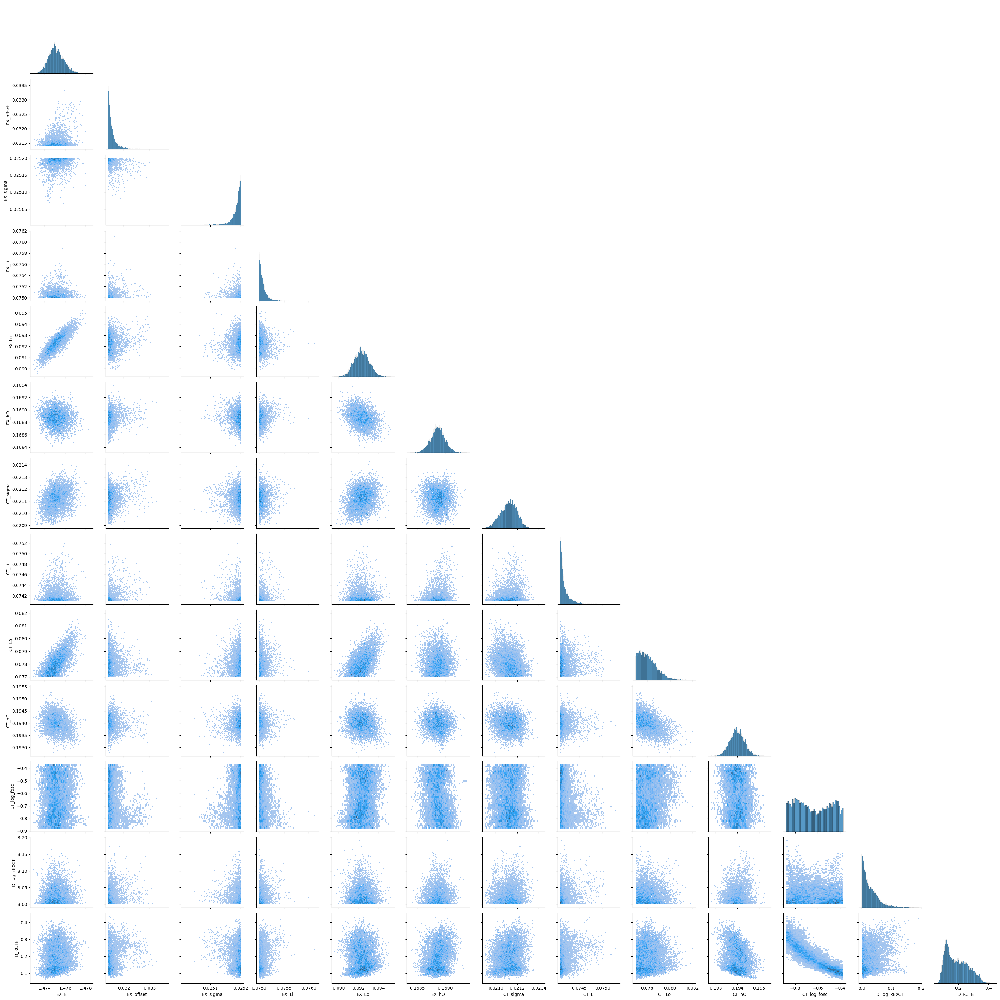

In [ ]:
# plot a pair grid plot
import seaborn as sns
def plot_pair_plot(id,discard=0,set_axis_limits=True):
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain(discard= discard, flat=True)
    labels=[]
    min_bound,max_bound = {},{}
    params_to_fit = df_all['params_to_fit_init'][id]
    for key in params_to_fit.keys():
        for keys in params_to_fit[key].keys():
            labels.append(f"{key}_{keys}")
            min_bound[f"{key}_{keys}"] = df_all['min_bounds'][id][key][keys]
            max_bound[f"{key}_{keys}"] = df_all['max_bounds'][id][key][keys]

    ndim = len(labels)
    df_samples = pd.DataFrame(samples, columns=labels)
    g = sns.pairplot(df_samples, kind="hist", corner=True)
    if set_axis_limits:
        for i,ax in enumerate(g.figure.axes):
            if ax.get_xlabel() in min_bound.keys():
                ax.set_xlim(min_bound[ax.get_xlabel()],max_bound[ax.get_xlabel()])
            if ax.get_ylabel() in min_bound.keys():
                ax.set_ylim(min_bound[ax.get_ylabel()],max_bound[ax.get_ylabel()])
    g.figure.show()
    return g
g = plot_pair_plot(0,discard=1000,set_axis_limits=False)


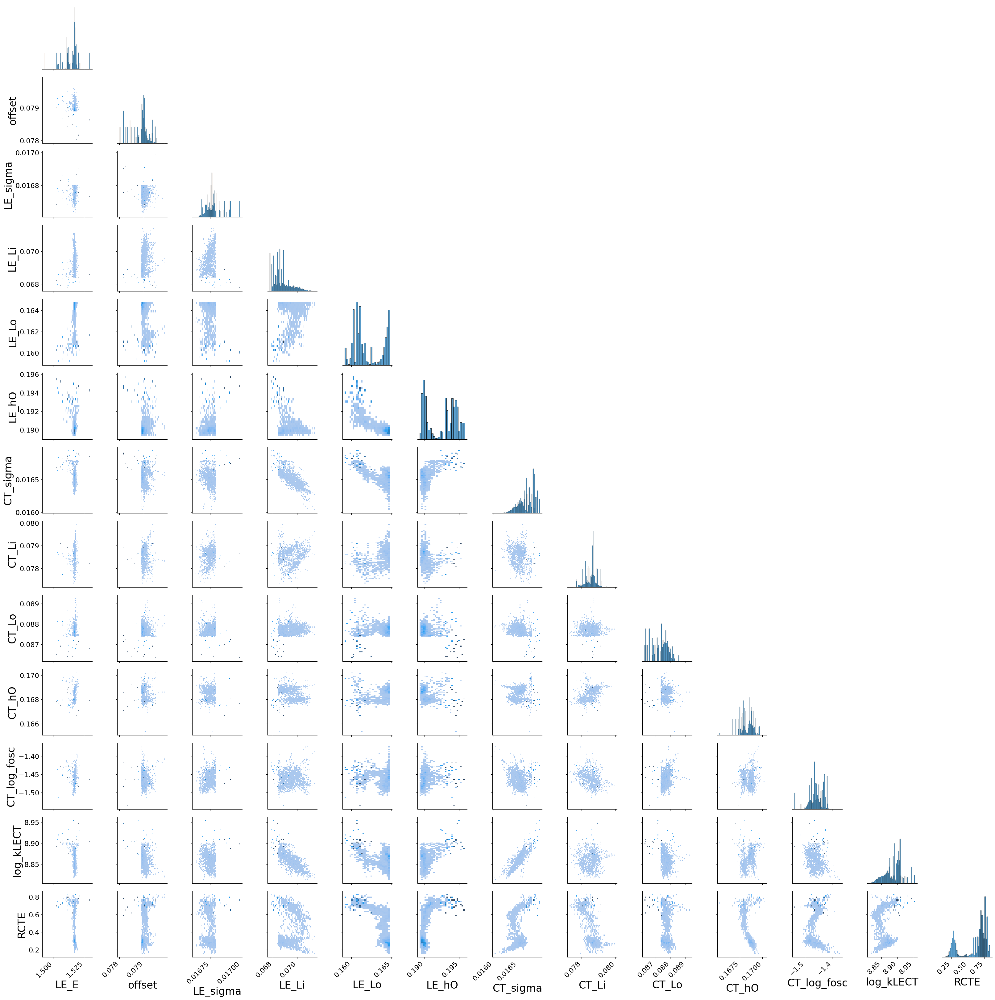

In [ ]:
import seaborn as sns
def plot_pair_plot(id,discard=0,set_axis_limits=True):
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain(discard=discard, flat=True)

    labels = [
        'LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO',
        'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 'log_kLECT', 'RCTE'
    ]
    min_bound, max_bound = {}, {}
    params_to_fit = df_all['params_to_fit_init'][id]
    for i, label in enumerate(labels):
        if label in df_all['min_bounds'][id].keys():
            min_bound[label] = df_all['min_bounds'][id].get(label, None)
            max_bound[label] = df_all['max_bounds'][id].get(label, None)
    ndim = len(labels)
    df_samples = pd.DataFrame(samples, columns=labels)
    g = sns.pairplot(df_samples, kind="hist", corner=True)

    if set_axis_limits:
        for i, ax in enumerate(g.figure.axes):
            xlabel = ax.get_xlabel()
            ylabel = ax.get_ylabel()
            if xlabel in min_bound.keys():
                ax.set_xlim(min_bound[xlabel], max_bound.get(xlabel, float('inf')))
            if ylabel in min_bound.keys():
                ax.set_ylim(min_bound[ylabel], max_bound.get(ylabel, float('inf')))

    for ax in g.axes.flat:
        if ax is not None:
            ax.xaxis.label.set_size(24)
            ax.yaxis.label.set_size(24)
            ax.tick_params(axis='both', which='major', labelsize = 16)

            for label in ax.get_xticklabels():
                label.set_rotation(45)
                label.set_horizontalalignment('right')
    plt.tight_layout()
    g.figure.show()
    return g
g = plot_pair_plot(3, discard=100, set_axis_limits=False)

(<Figure size 1200x1560 with 13 Axes>,
 array([<Axes: ylabel='LE_E'>, <Axes: ylabel='offset'>,
        <Axes: ylabel='LE_sigma'>, <Axes: ylabel='LE_Li'>,
        <Axes: ylabel='LE_Lo'>, <Axes: ylabel='LE_hO'>,
        <Axes: ylabel='CT_sigma'>, <Axes: ylabel='CT_Li'>,
        <Axes: ylabel='CT_Lo'>, <Axes: ylabel='CT_hO'>,
        <Axes: ylabel='CT_log_fosc'>, <Axes: ylabel='log_kLECT'>,
        <Axes: xlabel='Step number', ylabel='RCTE'>], dtype=object))

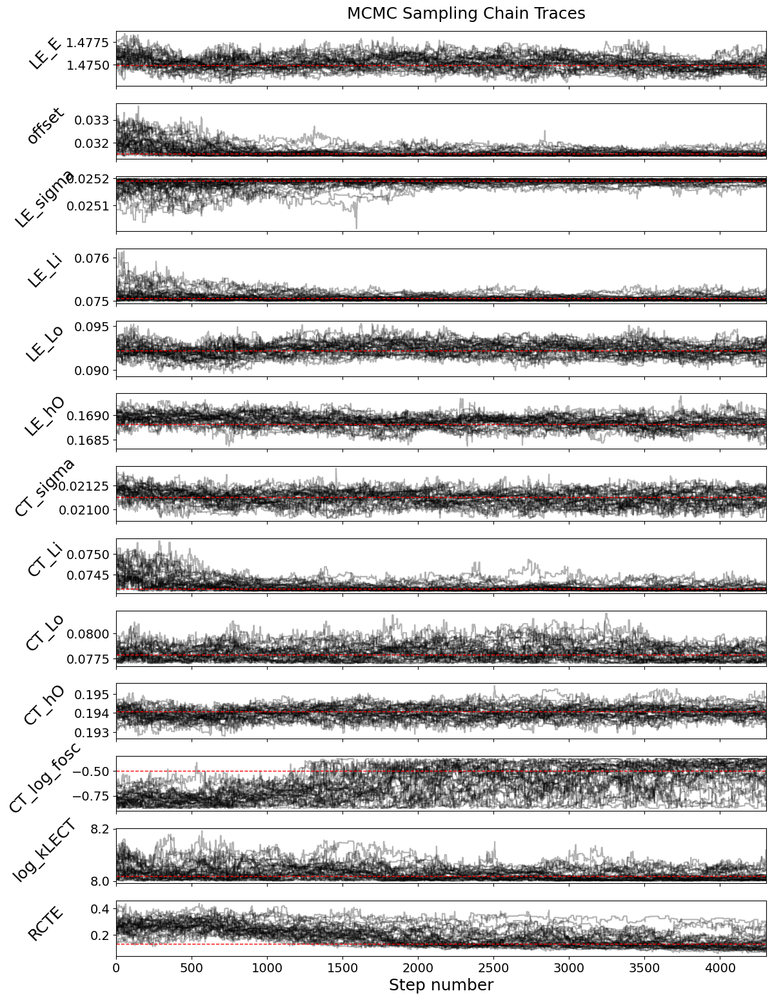

In [ ]:
def plot_enhanced_chains(id, discard=0, n_chains=None, save_svg=False):
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain(discard=discard)

    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']
    
    ndim = len(labels)
    nwalkers = samples.shape[1]

    if n_chains is not None and n_chains < nwalkers:
        selected_chains = np.random.choice(nwalkers, n_chains, replace=False)
        samples_subset = samples[:, selected_chains, :]
    else:
        samples_subset = samples

    fig, axes = plt.subplots(ndim, figsize=(12, ndim * 1.2), sharex=True)
    if ndim == 1:
        axes = [axes]

    for i in range(ndim):
        ax = axes[i]
        for j in range(samples_subset.shape[1]):
            ax.plot(samples_subset[:, j, i], "k", alpha=0.3)
        
        mean_value = np.mean(samples[-100:, :, i])
        ax.axhline(mean_value, color='r', lw=1, ls='--')
        
        ax.set_xlim(0, len(samples))
        ax.set_ylabel(labels[i], rotation=45, fontsize = 18)
        ax.yaxis.set_label_coords(-0.1, 0.5)
        ax.tick_params(axis='both', labelsize = 14)
    
    axes[-1].set_xlabel("Step number", fontsize = 18)
    fig.suptitle("MCMC Sampling Chain Traces", fontsize=18, x=0.6, y=0.99)
    fig.tight_layout()

    if save_svg:
        save_path = "./pl_temp_fit/bayes_params_results/D18Y5/"
        os.makedirs(save_path, exist_ok=True)
        svg_filename = save_path + f"mcmc_chains_id{id}_discard{discard}.svg"
        fig.savefig(svg_filename, format='svg')
    
    return fig, axes

plot_enhanced_chains(0, discard=1000, n_chains=None, save_svg=True)

posterior prediction check ./pl_temp_fit/Bayes_data_norm/D18Y5/PL/0.582.csv


(<Figure size 1000x1200 with 2 Axes>,
 <Axes: title={'center': 'EL Data Posterior Predictive Check'}, xlabel='Temperature (K)', ylabel='Intensity (a.u.)'>,
 <Axes: title={'center': 'PL Data Posterior Predictive Check'}, xlabel='Temperature (K)', ylabel='Intensity (a.u.)'>)

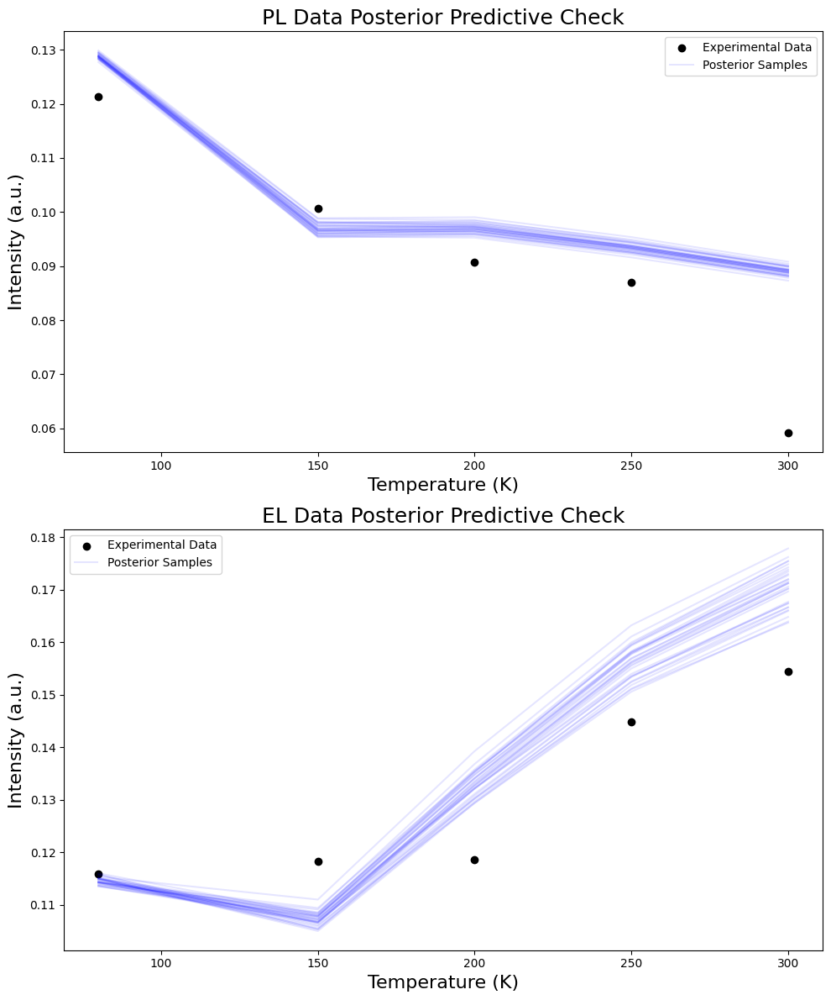

In [ ]:
def plot_posterior_predictive_check(id, discard=0, num_samples=30, save_svg=False):
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")

    csv_name_pl = df_all['csv_name_pl'][id]
    print(f"posterior prediction check {csv_name_pl}")
    Exp_data_pl, temperature_list_pl, hws_pl = Exp_data_utils.read_data(df_all['csv_name_pl'][id])
    Exp_data_el, temperature_list_el, hws_el = Exp_data_utils.read_data(df_all['csv_name_el'][id])

    samples = reader.get_chain(discard=discard, flat=True)
    if num_samples is None or num_samples > len(samples):
        num_samples = min(30, len(samples))

    model_config, model_config_save = config_utils.load_model_config(df_all['test_id'][id])
    fixed_parameters_dict, params_to_fit_init, min_bounds, max_bounds = (
        config_utils.get_dict_params(model_config_save)
    )
    model_config["temperature_list_el"] = temperature_list_el
    model_config["hws_el"] = hws_el
    model_config["temperature_list_pl"] = temperature_list_pl
    model_config["hws_pl"] = hws_pl
    fig, (ax2, ax1) = plt.subplots(2, 1, figsize=(10, 12))
    Exp_data_el_avg = np.mean(Exp_data_el, axis=0)
    Exp_data_pl_avg = np.mean(Exp_data_pl, axis=0)

    if len(Exp_data_el_avg) != len(temperature_list_el):
        Exp_data_el_avg = np.array([np.mean(Exp_data_el[:, i]) for i in range(min(Exp_data_el.shape[1], len(temperature_list_el)))])
        temperature_list_el = temperature_list_el[:len(Exp_data_el_avg)]

    if len(Exp_data_pl_avg) != len(temperature_list_pl):
        Exp_data_pl_avg = np.array([np.mean(Exp_data_pl[:, i]) for i in range(min(Exp_data_pl.shape[1], len(temperature_list_pl)))])
        temperature_list_pl = temperature_list_pl[:len(Exp_data_pl_avg)]

    ax1.scatter(temperature_list_el, Exp_data_el_avg, color='black', label='Experimental Data')
    ax2.scatter(temperature_list_pl, Exp_data_pl_avg, color='black', label='Experimental Data')

    idx = np.random.randint(0, len(samples), num_samples)
    for i in idx:
        sample_params = fit_el_utils.get_param_dict(df_all['params_to_fit_init'][id], samples[i,:])
        model_data_el, model_data_pl = generate_data_utils.el_trial(
            temperature_list_el,
            hws_el,
            temperature_list_pl,
            hws_pl,
            fixed_parameters_dict,
            sample_params,
        )

        model_data_el = model_data_el / np.max(model_data_el.reshape(-1, 1))
        model_data_pl = model_data_pl / np.max(model_data_pl.reshape(-1, 1))

        el_avg_per_temp = np.mean(model_data_el, axis=0)
        pl_avg_per_temp = np.mean(model_data_pl, axis=0)

        ax1.plot(temperature_list_el, el_avg_per_temp, color='blue', alpha=0.1, label="Posterior Samples" if i == idx[0] else "")
        ax2.plot(temperature_list_pl, pl_avg_per_temp, color='blue', alpha=0.1, label="Posterior Samples" if i == idx[0] else "")

    ax1.set_title('EL Data Posterior Predictive Check', fontsize=18)
    ax2.set_title('PL Data Posterior Predictive Check', fontsize=18)
    ax1.set_xlabel('Temperature (K)', fontsize=16)
    ax2.set_xlabel('Temperature (K)', fontsize=16)
    ax1.set_ylabel('Intensity (a.u.)', fontsize=16)
    ax2.set_ylabel('Intensity (a.u.)', fontsize=16)
    ax1.legend(fontsize=10)
    ax2.legend(fontsize=10)

    fig.tight_layout()
    
    if save_svg:
        save_path = "./pl_temp_fit/bayes_params_results/D18Y5/"
        os.makedirs(save_path, exist_ok=True)
        svg_filename = save_path + f"posterior_check_id{id}_discard{discard}.svg"
        fig.savefig(svg_filename, format='svg')
    
    return fig, ax1, ax2

plot_posterior_predictive_check(0, discard=1000, num_samples=None, save_svg=True)

Parametric statistical analysis 
      Parameter      Mean       Std  5% Percentile  95% Percentile
0          LE_E  1.475003  0.001588       1.473729        1.476525
1        offset  0.031722  0.000416       0.031409        0.032629
2      LE_sigma  0.025120  0.000310       0.024953        0.025199
3         LE_Li  0.075140  0.000208       0.075005        0.075547
4         LE_Lo  0.091959  0.001176       0.089354        0.093476
5         LE_hO  0.168915  0.000194       0.168666        0.169205
6      CT_sigma  0.021133  0.000100       0.020990        0.021262
7         CT_Li  0.074381  0.000515       0.074105        0.075693
8         CT_Lo  0.078205  0.000839       0.077116        0.079850
9         CT_hO  0.193975  0.000357       0.193392        0.194544
10  CT_log_fosc -0.649659  0.149642      -0.861629       -0.407815
11    log_kLECT  8.045911  0.061538       8.001774        8.183834
12         RCTE  0.207556  0.085756       0.101726        0.338326


(<Figure size 1000x600 with 1 Axes>,
 <Axes: title={'center': 'Parameter Statistics Analysis'}, xlabel='Parameter Value'>,
       Parameter      Mean       Std  5% Percentile  95% Percentile
 0          LE_E  1.475003  0.001588       1.473729        1.476525
 1        offset  0.031722  0.000416       0.031409        0.032629
 2      LE_sigma  0.025120  0.000310       0.024953        0.025199
 3         LE_Li  0.075140  0.000208       0.075005        0.075547
 4         LE_Lo  0.091959  0.001176       0.089354        0.093476
 5         LE_hO  0.168915  0.000194       0.168666        0.169205
 6      CT_sigma  0.021133  0.000100       0.020990        0.021262
 7         CT_Li  0.074381  0.000515       0.074105        0.075693
 8         CT_Lo  0.078205  0.000839       0.077116        0.079850
 9         CT_hO  0.193975  0.000357       0.193392        0.194544
 10  CT_log_fosc -0.649659  0.149642      -0.861629       -0.407815
 11    log_kLECT  8.045911  0.061538       8.001774        8.

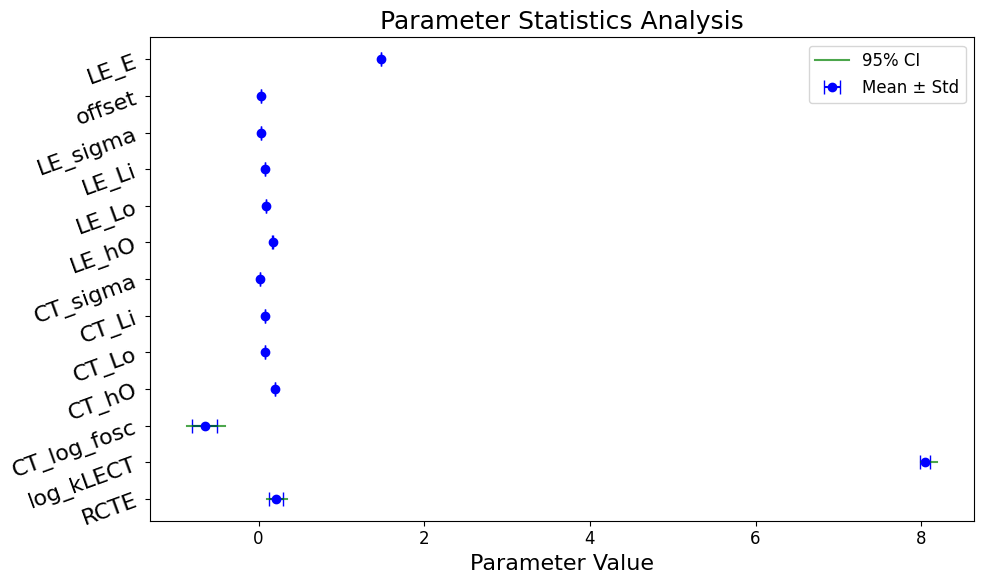

In [ ]:
def plot_parameter_statistics(id, discard=0):
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain(discard=discard, flat=True)

    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']

    mean_values = np.mean(samples, axis=0)
    std_values = np.std(samples, axis=0)
    percentile_5 = np.percentile(samples, 5, axis=0)
    percentile_95 = np.percentile(samples, 95, axis=0)

    statistics = {
        'Parameter': labels,
        'Mean': mean_values,
        'Std': std_values,
        '5% Percentile': percentile_5,
        '95% Percentile': percentile_95
    }
    stats_df = pd.DataFrame(statistics)
    fig, ax = plt.subplots(figsize=(10, 6))

    y_pos = np.arange(len(labels))
    ax.errorbar(mean_values, y_pos, xerr=std_values, fmt='o', capsize=5, 
               color='blue', label='Mean ± Std')

    for i, (p5, p95) in enumerate(zip(percentile_5, percentile_95)):
        ax.plot([p5, p95], [y_pos[i], y_pos[i]], color='green', alpha=0.7, label='95% CI' if i==0 else '')

    ax.set_yticks(y_pos)
    ax.set_yticklabels(labels, rotation=20, fontsize = 16)
    ax.set_title('Parameter Statistics Analysis', fontsize=18)
    ax.set_xlabel('Parameter Value', fontsize=16)
    ax.invert_yaxis()
    ax.legend()
    
    fig.tight_layout()
    print(f"Parametric statistical analysis \n{stats_df}")
    return fig, ax, stats_df

plot_parameter_statistics(0, discard=0)

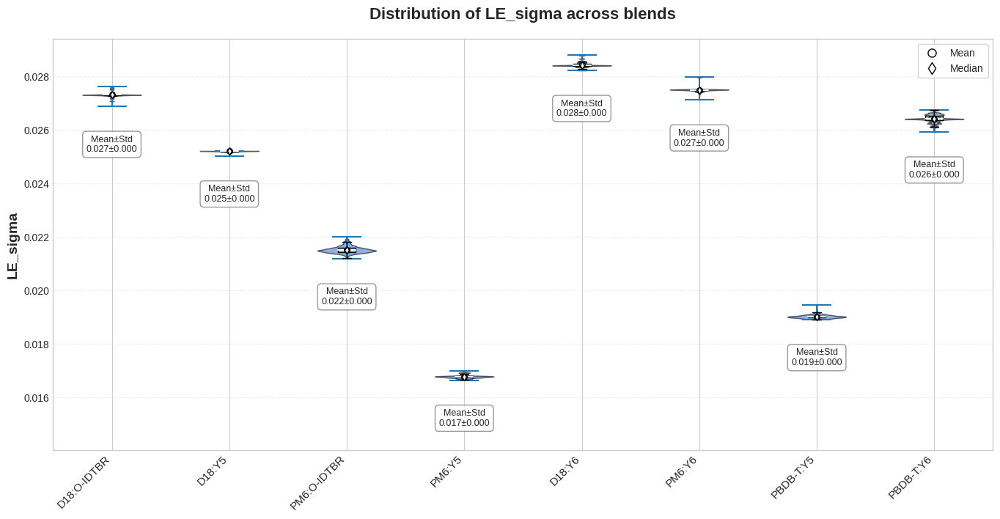

In [ ]:
def plot_violin_parameter_comparison(parameter_name, discard=0, figsize=(14, 8)):
    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']
    
    if parameter_name not in labels:
        raise ValueError(f"Parameter '{parameter_name}' is invalid. Valid parameters: {labels}")
    
    param_index = labels.index(parameter_name)
    ordered_blend_names = [
        "D18:O-IDTBR", "D18:Y5", "PM6:O-IDTBR", "PM6:Y5", 
        "D18:Y6", "PM6:Y6", "PBDB-T:Y5", "PBDB-T:Y6"
    ]
    
    blend_mapping = {}
    for id in range(len(df_all)):
        blend_key = df_all['blend'][id].split('/')[0]
        
        if "D18OIDTBR" in blend_key:
            blend_mapping["D18:O-IDTBR"] = id
        elif "D18Y5" in blend_key:
            blend_mapping["D18:Y5"] = id
        elif "PM6OIDTBR" in blend_key:
            blend_mapping["PM6:O-IDTBR"] = id
        elif "PM6Y5" in blend_key:
            blend_mapping["PM6:Y5"] = id
        elif "D18Y6" in blend_key:
            blend_mapping["D18:Y6"] = id
        elif "PM6Y6" in blend_key:
            blend_mapping["PM6:Y6"] = id
        elif "PBDB-TY5" in blend_key:
            blend_mapping["PBDB-T:Y5"] = id
        elif "PBDB-TY6" in blend_key:
            blend_mapping["PBDB-T:Y6"] = id
    
    all_distributions = []
    found_blends = []
    
    for blend_name in ordered_blend_names:
        if blend_name in blend_mapping:
            id = blend_mapping[blend_name]
            found_blends.append(blend_name)
            
            try:
                filename = df_all['save_folder'][id] + "/sampler.h5"
                try:
                    reader = Emcee_utils.hDFBackend_2(filename, name="multi_core")
                    samples = reader.get_chain(discard=discard, flat=True)
                except:
                    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
                    samples = reader.get_chain(discard=discard, flat=True)
                param_distribution = samples[:, param_index]
                all_distributions.append(param_distribution)
            except Exception as e:
                print(f"Error processing blend {blend_name}: {e}")
                all_distributions.append([])
        else:
            print(f"Warning: Blend {blend_name} not found in dataset")

    if not all_distributions:
        raise ValueError("No distributions found for plotting")

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=figsize)
    violin_color = '#4878D0'
    parts = ax.violinplot(all_distributions, showmeans=False, showmedians=False)
    
    for pc in parts['bodies']:
        pc.set_facecolor(violin_color)
        pc.set_edgecolor('black')
        pc.set_alpha(0.6)
        pc.set_linewidth(1)

    means = [np.mean(dist) if len(dist) > 0 else np.nan for dist in all_distributions]
    medians = [np.median(dist) if len(dist) > 0 else np.nan for dist in all_distributions]
    stds = [np.std(dist) if len(dist) > 0 else np.nan for dist in all_distributions]

    for i, (mean, median) in enumerate(zip(means, medians)):
        if not np.isnan(mean) and not np.isnan(median):
            ax.scatter(i+1, mean, color='white', s=30, zorder=3, edgecolor='black')
            ax.scatter(i+1, median, color='white', marker='d', s=25, zorder=3, edgecolor='black')

    bp = ax.boxplot(all_distributions, positions=range(1, len(all_distributions)+1),
                   widths=0.15, patch_artist=False, showfliers=False, 
                   medianprops={'color':'white', 'linewidth':1.5},
                   boxprops={'color':'black', 'linewidth':1},
                   whiskerprops={'color':'black', 'linewidth':1},
                   capprops={'color':'black', 'linewidth':1})

    ax.set_xticks(np.arange(1, len(found_blends) + 1))
    ax.set_xticklabels(found_blends, rotation=45, ha='right', fontsize=11)
    ax.set_ylabel(parameter_name, fontsize=14, fontweight='bold')
    ax.set_title(f'Distribution of {parameter_name} across blends', fontsize=16, fontweight='bold', pad=20)
    ax.grid(axis='y', linestyle='--', alpha=0.3)

    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    
    distribution_mins = [np.min(dist) if len(dist) > 0 else np.nan for dist in all_distributions]

    for i, (mean, std, dist_min) in enumerate(zip(means, stds, distribution_mins)):
        if not np.isnan(mean) and not np.isnan(std) and not np.isnan(dist_min):
            label_y_pos = dist_min - y_range * 0.08
            ax.text(i+1, label_y_pos, f"Mean±Std\n{mean:.3f}±{std:.3f}", 
                    ha='center', va='top', fontsize=9, 
                    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray', boxstyle='round,pad=0.4'))
    
    ax.set_ylim(y_min - y_range * 0.15, y_max)
    
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='w', 
               markeredgecolor='black', markersize=8, label='Mean'),
        Line2D([0], [0], marker='d', color='w', markerfacecolor='w', 
               markeredgecolor='black', markersize=8, label='Median')
    ]
    ax.legend(handles=legend_elements, loc='upper right', frameon=True)
    fig.tight_layout(pad=2.0, rect=[0, 0.05, 1, 0.98])
    return fig, ax

fig, ax = plot_violin_parameter_comparison('LE_sigma', discard=1000)

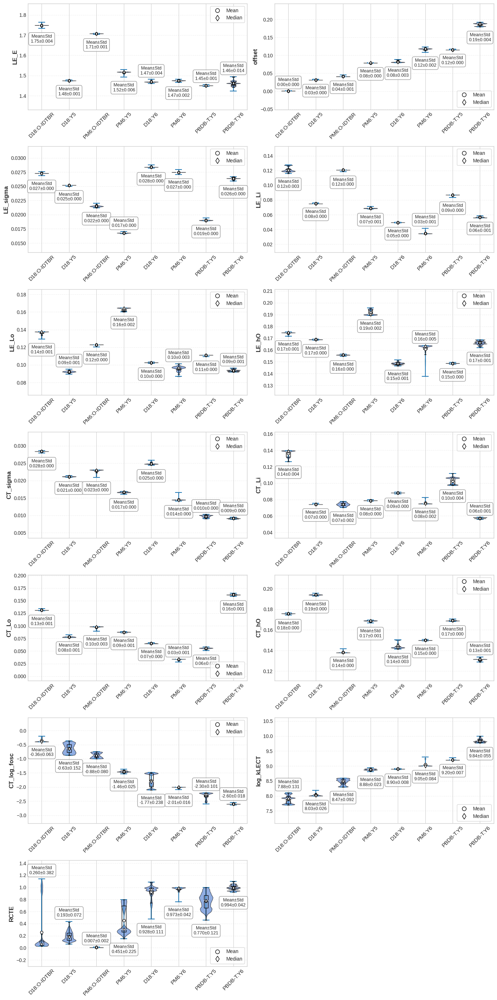

In [ ]:
def plot_all_parameters_violin(discard=1000, figsize=(14, 28)):
    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']
    plt.rcParams['font.family'] = 'Liberation Sans'
    
    fig, axes = plt.subplots(7, 2, figsize=figsize, gridspec_kw={'width_ratios': [5, 5], 'height_ratios': [2]*7})
    axes = axes.flatten()
    
    for i, param_name in enumerate(labels):
        if i < len(axes): 
            precision_3_params = ['LE_sigma', 'CT_sigma', 'RCTE']
            create_violin_plot(param_name, discard, ax=axes[i], 
                              precision=3 if param_name in precision_3_params else 2)
    for j in range(len(labels), len(axes)):
        axes[j].set_visible(False)
    plt.tight_layout()
    
    import os
    save_path = "./pl_temp_fit/bayes_params_results"
    os.makedirs(save_path, exist_ok=True)
    plt.savefig(os.path.join(save_path, 'parameter_violin_plots.svg'), format='svg', bbox_inches='tight')
    
    return fig

def create_violin_plot(parameter_name, discard=0, ax=None, precision=2):
    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']
    param_index = labels.index(parameter_name)

    ordered_blend_names = [
        "D18:O-IDTBR", "D18:Y5", "PM6:O-IDTBR", "PM6:Y5", 
        "D18:Y6", "PM6:Y6", "PBDB-T:Y5", "PBDB-T:Y6"
    ]

    blend_mapping = {}
    for id in range(len(df_all)):
        blend_key = df_all['blend'][id].split('/')[0]

        if "D18OIDTBR" in blend_key:
            blend_mapping["D18:O-IDTBR"] = id
        elif "D18Y5" in blend_key:
            blend_mapping["D18:Y5"] = id
        elif "PM6OIDTBR" in blend_key:
            blend_mapping["PM6:O-IDTBR"] = id
        elif "PM6Y5" in blend_key:
            blend_mapping["PM6:Y5"] = id
        elif "D18Y6" in blend_key:
            blend_mapping["D18:Y6"] = id
        elif "PM6Y6" in blend_key:
            blend_mapping["PM6:Y6"] = id
        elif "PBDB-TY5" in blend_key:
            blend_mapping["PBDB-T:Y5"] = id
        elif "PBDB-TY6" in blend_key:
            blend_mapping["PBDB-T:Y6"] = id
    
    all_distributions = []
    found_blends = []

    for blend_name in ordered_blend_names:
        if blend_name in blend_mapping:
            id = blend_mapping[blend_name]
            found_blends.append(blend_name)
            
            try:
                filename = df_all['save_folder'][id] + "/sampler.h5"
                try:
                    reader = Emcee_utils.hDFBackend_2(filename, name="multi_core")
                    samples = reader.get_chain(discard=discard, flat=True)
                except:
                    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
                    samples = reader.get_chain(discard=discard, flat=True)

                param_distribution = samples[:, param_index]
                all_distributions.append(param_distribution)
            except Exception as e:
                print(f"error: {e}")
                all_distributions.append([])
        else:
            print(f"lost {blend_name}")
    
    plt.style.use('seaborn-v0_8-whitegrid')
    if ax is None:
        fig, ax = plt.subplots()
    violin_color = '#4878D0'
    parts = ax.violinplot(all_distributions, showmeans=False, showmedians=False)
    
    for pc in parts['bodies']:
        pc.set_facecolor(violin_color)
        pc.set_edgecolor('black')
        pc.set_alpha(0.6)
        pc.set_linewidth(1)

    means = [np.mean(dist) if len(dist) > 0 else np.nan for dist in all_distributions]
    medians = [np.median(dist) if len(dist) > 0 else np.nan for dist in all_distributions]
    stds = [np.std(dist) if len(dist) > 0 else np.nan for dist in all_distributions]

    for i, (mean, median) in enumerate(zip(means, medians)):
        if not np.isnan(mean) and not np.isnan(median):
            ax.scatter(i+1, mean, color='white', s=30, zorder=3, edgecolor='black')
            ax.scatter(i+1, median, color='white', marker='d', s=25, zorder=3, edgecolor='black')
    
    bp = ax.boxplot(all_distributions, positions=range(1, len(all_distributions)+1),
                  widths=0.15, patch_artist=False, showfliers=False, 
                  medianprops={'color':'white', 'linewidth':1.5},
                  boxprops={'color':'black', 'linewidth':1},
                  whiskerprops={'color':'black', 'linewidth':1},
                  capprops={'color':'black', 'linewidth':1})
    
    ax.set_xticks(np.arange(1, len(found_blends) + 1))
    ax.set_xticklabels(found_blends, rotation=45, ha='center', fontsize=11)
    ax.set_ylabel(parameter_name, fontsize=12, fontweight='bold')
    ax.grid(axis='y', linestyle='--', alpha=0.3)

    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    
    distribution_mins = [np.min(dist) if len(dist) > 0 else np.nan for dist in all_distributions]
    distribution_maxs = [np.max(dist) if len(dist) > 0 else np.nan for dist in all_distributions]
    
    upper_right_has_data = False
    for i, dist in enumerate(all_distributions):
        if len(dist) > 0:
            if i >= len(all_distributions)*0.75 and np.percentile(dist, 95) > (y_max - y_range * 0.2):
                upper_right_has_data = True
                break
                
    legend_loc = 'lower right' if upper_right_has_data else 'upper right'
    
    for i, (mean, std, dist_min, dist_max) in enumerate(zip(means, stds, distribution_mins, distribution_maxs)):
        if not np.isnan(mean) and not np.isnan(std) and not np.isnan(dist_min):
            if dist_min < y_min + y_range * 0.15:
                label_y_pos = dist_max + y_range * 0.05
                va_align = 'bottom'
            else:
                label_y_pos = dist_min - y_range * 0.08
                va_align = 'top'

            mean_format = f"{{:.{precision}f}}"
            mean_str = mean_format.format(mean)
            
            ax.text(i+1, label_y_pos, f"Mean±Std\n{mean_str}±{std:.3f}", 
                    ha='center', va=va_align, fontsize=9, 
                    bbox=dict(facecolor='white', alpha=0.8, edgecolor='gray', boxstyle='round,pad=0.4'))

    y_padding = y_range * 0.2
    ax.set_ylim(y_min - y_padding, y_max + y_padding)
    
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], marker='o', color='w', markerfacecolor='w', 
               markeredgecolor='black', markersize=8, label='Mean'),
        Line2D([0], [0], marker='d', color='w', markerfacecolor='w', 
               markeredgecolor='black', markersize=8, label='Median')
    ]
    ax.legend(handles=legend_elements, loc=legend_loc, frameon=True)
    
    return ax

fig = plot_all_parameters_violin(discard=1000)

./pl_temp_fit/Bayes_data_norm/D18Y5/PL/0.582.csv
Random selected sample number: 67500 (Total samples: 137792)
图像已保存到: ./pl_temp_fit/bayes_params_results/D18Y5/residual_analysis_id0_discard1000.svg


(<Figure size 1400x1000 with 4 Axes>,
 array([[<Axes: title={'center': 'PL Residuals vs Temperature'}, xlabel='Temperature (K)', ylabel='Residuals'>,
         <Axes: title={'center': 'EL Residuals vs Temperature'}, xlabel='Temperature (K)', ylabel='Residuals'>],
        [<Axes: title={'center': 'PL Residuals at 80.0K for Different Photon Energy'}, xlabel='Photon Energy (eV)', ylabel='Residuals'>,
         <Axes: title={'center': 'EL Residuals at 80.0K for Different Photon Energy'}, xlabel='Photon Energy (eV)', ylabel='Residuals'>]],
       dtype=object))

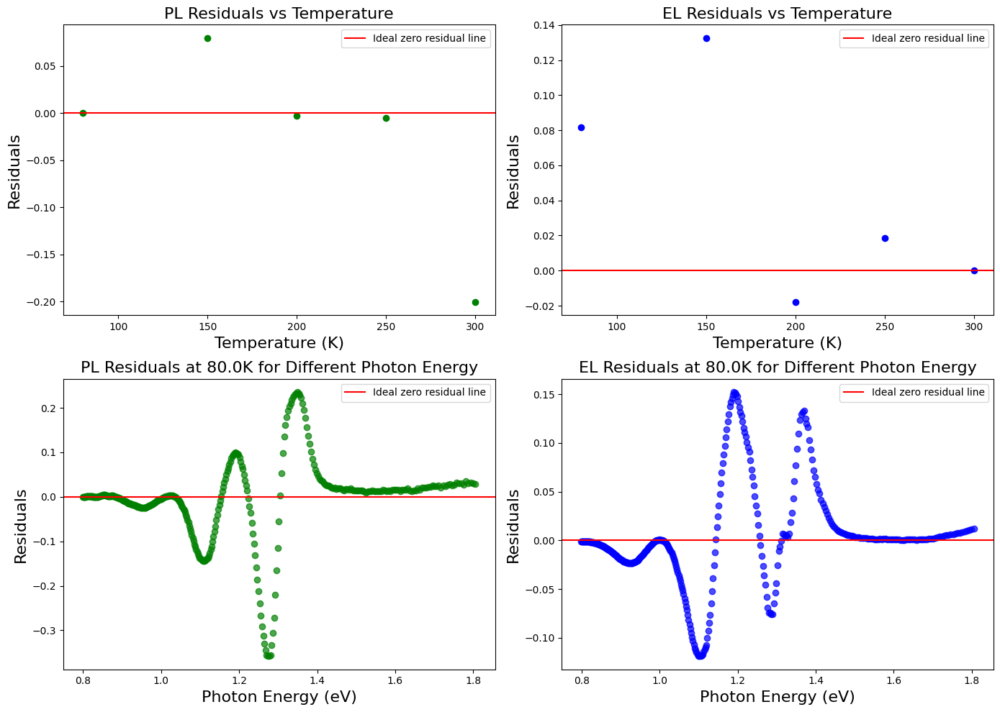

In [ ]:
def plot_residual_analysis(id, discard=0, save_svg=False):
    
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    csv_name_pl = df_all['csv_name_pl'][id]
    print(f"{csv_name_pl}")
    Exp_data_pl, temperature_list_pl, hws_pl = Exp_data_utils.read_data(df_all['csv_name_pl'][id])
    Exp_data_el, temperature_list_el, hws_el = Exp_data_utils.read_data(df_all['csv_name_el'][id])
    sample = reader.get_chain(discard=discard,flat=True)
    sample_num = np.random.randint(0, sample.shape[0])
    print(f"Random selected sample number: {sample_num} (Total samples: {sample.shape[0]})")
    data_fit = sample[sample_num,:]
    true_parameters = fit_el_utils.get_param_dict(df_all['params_to_fit_init'][id],data_fit)
    csv_name_el =df_all['csv_name_el'][id]
    csv_name_pl = df_all['csv_name_pl'][id]

    Exp_data_pl, temperature_list_pl, hws_pl = Exp_data_utils.read_data(
        csv_name_pl
    )
    Exp_data_el, temperature_list_el, hws_el = Exp_data_utils.read_data(
        csv_name_el
    )

    model_config, model_config_save = config_utils.load_model_config(
        df_all['test_id'][id]
    )
    fixed_parameters_dict, params_to_fit_init, min_bounds, max_bounds = (
        config_utils.get_dict_params(model_config_save)
    )
    model_config["temperature_list_el"] = temperature_list_el
    model_config["hws_el"] = hws_el
    model_config["temperature_list_pl"] = temperature_list_pl
    model_config["hws_pl"] = hws_pl

    model_data_el, model_data_pl = generate_data_utils.el_trial(
        temperature_list_el,
        hws_el,
        temperature_list_pl,
        hws_pl,
        fixed_parameters_dict,
        true_parameters,
    )

    Exp_data_el_avg = np.mean(Exp_data_el, axis=0)
    Exp_data_pl_avg = np.mean(Exp_data_pl, axis=0)

    if len(Exp_data_el_avg) != len(temperature_list_el):
        print(f"Exp_data_el_avg length={len(Exp_data_el_avg)}, temperature_list_el length={len(temperature_list_el)}")
        if Exp_data_el.shape[1] == len(temperature_list_el):
            Exp_data_el_avg = np.mean(Exp_data_el, axis=0)
        else:
            Exp_data_el_avg = np.array([np.mean(Exp_data_el[:, i]) for i in range(min(Exp_data_el.shape[1], len(temperature_list_el)))])
            temperature_list_el = temperature_list_el[:len(Exp_data_el_avg)]
    
    if len(Exp_data_pl_avg) != len(temperature_list_pl):
        print(f"Exp_data_pl_avg length={len(Exp_data_pl_avg)}, temperature_list_pl length={len(temperature_list_pl)}")
        if Exp_data_pl.shape[1] == len(temperature_list_pl):
            Exp_data_pl_avg = np.mean(Exp_data_pl, axis=0)
        else:
            Exp_data_pl_avg = np.array([np.mean(Exp_data_pl[:, i]) for i in range(min(Exp_data_pl.shape[1], len(temperature_list_pl)))])
            temperature_list_pl = temperature_list_pl[:len(Exp_data_pl_avg)]

    model_data_el_avg = np.mean(model_data_el, axis=0)
    model_data_pl_avg = np.mean(model_data_pl, axis=0)

    model_data_el_avg = model_data_el_avg[:len(temperature_list_el)]
    model_data_pl_avg = model_data_pl_avg[:len(temperature_list_pl)]

    Exp_data_el_avg_norm = Exp_data_el_avg / np.max(Exp_data_el_avg)
    Exp_data_pl_avg_norm = Exp_data_pl_avg / np.max(Exp_data_pl_avg)
    model_data_el_avg_norm = model_data_el_avg / np.max(model_data_el_avg)
    model_data_pl_avg_norm = model_data_pl_avg / np.max(model_data_pl_avg)

    el_residuals = Exp_data_el_avg_norm - model_data_el_avg_norm
    pl_residuals = Exp_data_pl_avg_norm - model_data_pl_avg_norm

    fig, axs = plt.subplots(2, 2, figsize=(14, 10))

    axs[0, 0].scatter(temperature_list_pl, pl_residuals, color='green')
    axs[0, 0].axhline(y=0, color='red', linestyle='-', label='Ideal zero residual line')
    axs[0, 0].legend()
    axs[0, 0].set_title('PL Residuals vs Temperature', fontsize=16)
    axs[0, 0].set_xlabel('Temperature (K)', fontsize=16)
    axs[0, 0].set_ylabel('Residuals', fontsize=16)

    axs[0, 1].scatter(temperature_list_el, el_residuals, color='blue')
    axs[0, 1].axhline(y=0, color='red', linestyle='-', label='Ideal zero residual line')
    axs[0, 1].legend()
    axs[0, 1].set_title('EL Residuals vs Temperature', fontsize=16)
    axs[0, 1].set_xlabel('Temperature (K)', fontsize=16)
    axs[0, 1].set_ylabel('Residuals', fontsize=16)

    if len(temperature_list_pl) > 0:
        temp_idx_pl = 0
        pl_all_wave_residuals = Exp_data_pl[:, temp_idx_pl] / np.max(Exp_data_pl[:, temp_idx_pl]) - model_data_pl[:, temp_idx_pl] / np.max(model_data_pl[:, temp_idx_pl])
        axs[1, 0].scatter(hws_pl, pl_all_wave_residuals, color='green', alpha=0.7)
        axs[1, 0].axhline(y=0, color='red', linestyle='-', label='Ideal zero residual line')
        axs[1, 0].legend()
        axs[1, 0].set_title(f'PL Residuals at {temperature_list_pl[temp_idx_pl]}K for Different Photon Energy', fontsize=16)
        axs[1, 0].set_xlabel('Photon Energy (eV)', fontsize=16)
        axs[1, 0].set_ylabel('Residuals', fontsize=16)

    if len(temperature_list_el) > 0:
        temp_idx_el = 0
        el_all_wave_residuals = Exp_data_el[:, temp_idx_el] / np.max(Exp_data_el[:, temp_idx_el]) - model_data_el[:, temp_idx_el] / np.max(model_data_el[:, temp_idx_el])
        axs[1, 1].scatter(hws_el, el_all_wave_residuals, color='blue', alpha=0.7)
        axs[1, 1].axhline(y=0, color='red', linestyle='-', label='Ideal zero residual line')
        axs[1, 1].legend()
        axs[1, 1].set_title(f'EL Residuals at {temperature_list_el[temp_idx_el]}K for Different Photon Energy', fontsize=16)
        axs[1, 1].set_xlabel('Photon Energy (eV)', fontsize=16)
        axs[1, 1].set_ylabel('Residuals', fontsize=16)

    fig.tight_layout()

    if save_svg:
        save_path = "./pl_temp_fit/bayes_params_results/D18Y5/"
        os.makedirs(save_path, exist_ok=True)
        svg_filename = save_path + f"residual_analysis_id{id}_discard{discard}.svg"
        fig.savefig(svg_filename, format='svg')
        print(f"图像已保存到: {svg_filename}")
    
    return fig, axs

plot_residual_analysis(0, discard=1000, save_svg=True)

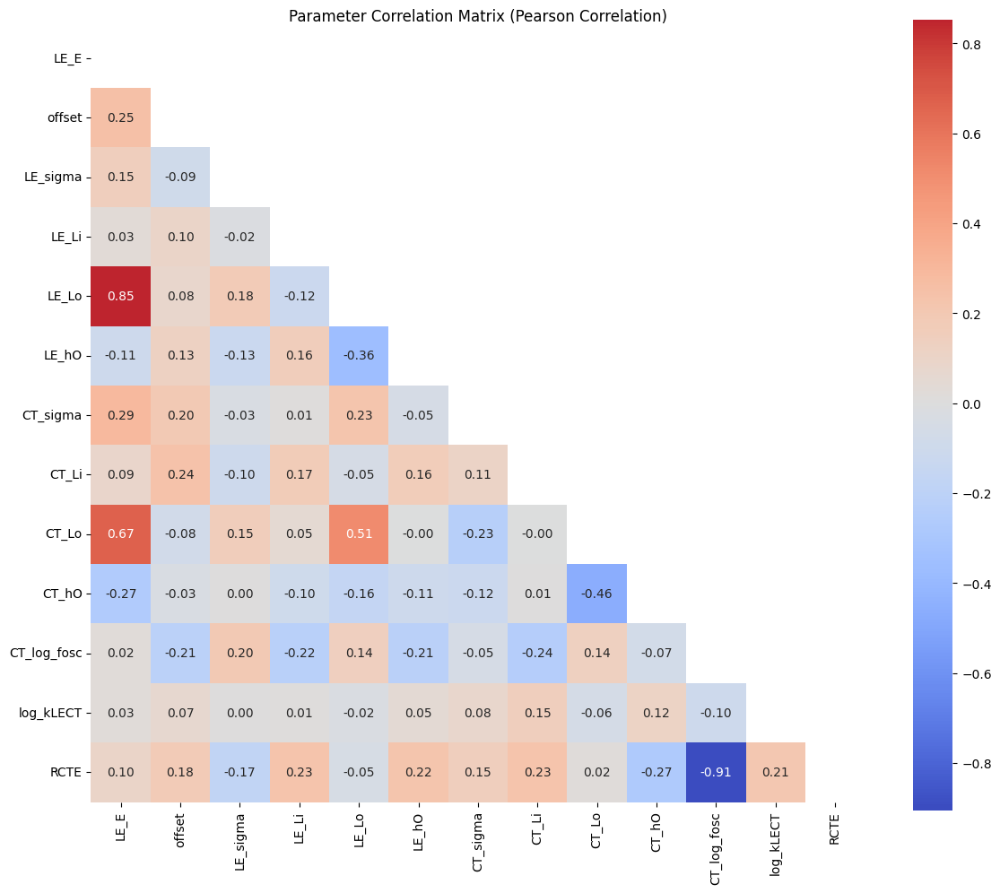

In [ ]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from ntq import Emcee_utils, config_utils

def load_mcmc_data(base_directory='./pl_temp_fit/'):
    os.chdir(base_directory)
    list_model_config = []
    json_files = glob.glob('fit_experimental_emcee_el/fit_data_base/*.json')
    
    for id, json_file in enumerate(json_files):
        try:
            model_config, model_config_save = config_utils.load_model_config(
                json_file.split('/')[-1].replace('.json','')
            )
        except Exception as e:
            print(e)
            continue
        if os.path.exists(model_config_save['save_folder']+'/sampler.h5'):
            filename = model_config_save['save_folder'] + "/sampler.h5"
            try: 
                reader = Emcee_utils.hDFBackend_2(filename, name="multi_core")
                distribution = reader.get_chain(flat=True)
            except:
                reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
                distribution = reader.get_chain(flat=True)
            
            true_parameters = list(np.mean(distribution, axis=0))
            model_config_save['mean'] = [f"{x:.3f}" for x in true_parameters]          
            model_config_save['num_iteration'] = reader.iteration  
            log_prob = reader.get_log_prob(flat=True)  
            model_config_save['max_log_prob'] = np.max(log_prob)
            list_model_config.append(model_config_save)
            
    return pd.DataFrame(list_model_config)

def plot_correlation_matrix(id, df_all, discard=0, method='pearson', figsize=(12, 10)):
    
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain(discard=discard, flat=True)
    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']

    df_samples = pd.DataFrame(samples, columns=labels)
    corr_matrix = df_samples.corr(method=method)
    fig, ax = plt.subplots(figsize=figsize)
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, 
                mask=mask,
                cmap='coolwarm', 
                center=0,
                annot=True,
                fmt='.2f',
                square=True,
                ax=ax)
    
    plt.title(f'Parameter Correlation Matrix ({method.capitalize()} Correlation)')
    plt.tight_layout()
    
    return fig, ax, corr_matrix

def plot_parameter_pairs(id, df_all, discard=0, selected_params=None):
    
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain(discard=discard, flat=True)

    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']

    min_bound, max_bound = {}, {}
    params_to_fit = df_all['params_to_fit_init'][id]
    for key in params_to_fit.keys():
        for keys in params_to_fit[key].keys():
            param_name = f"{key}_{keys}"
            if param_name in labels:
                min_bound[param_name] = df_all['min_bounds'][id][key][keys]
                max_bound[param_name] = df_all['max_bounds'][id][key][keys]
    df_samples = pd.DataFrame(samples, columns=labels)
    if selected_params is not None:
        df_samples = df_samples[selected_params]
    g = sns.pairplot(df_samples, 
                     diag_kind="hist",
                     plot_kws={'alpha': 0.5},
                     diag_kws={'bins': 30})
    g.fig.suptitle(f"Parameter Pairs Analysis - {df_all['csv_name_pl'][id].split('/')[-1]}", 
                   y=1.02)

    for i, ax in enumerate(g.axes.flat):
        if ax is not None:
            if ax.get_xlabel() in min_bound:
                ax.set_xlim(min_bound[ax.get_xlabel()], max_bound[ax.get_xlabel()])
            if ax.get_ylabel() in min_bound:
                ax.set_ylim(min_bound[ax.get_ylabel()], max_bound[ax.get_ylabel()])
    
    plt.tight_layout()
    return g

def analyze_parameter_correlations(id, df_all, discard=0, correlation_threshold=0.5):
    
    filename = df_all['save_folder'][id] + "/sampler.h5"
    reader = Emcee_utils.hDFBackend_2(filename, name="single_core")
    samples = reader.get_chain(discard=discard, flat=True)

    labels = ['LE_E', 'offset', 'LE_sigma', 'LE_Li', 'LE_Lo', 'LE_hO', 
              'CT_sigma', 'CT_Li', 'CT_Lo', 'CT_hO', 'CT_log_fosc', 
              'log_kLECT', 'RCTE']

    df_samples = pd.DataFrame(samples, columns=labels)
    corr_matrix = df_samples.corr()

    significant_correlations = []
    for i in range(len(labels)):
        for j in range(i+1, len(labels)):
            corr = corr_matrix.iloc[i, j]
            if abs(corr) >= correlation_threshold:
                significant_correlations.append({
                    'Parameter 1': labels[i],
                    'Parameter 2': labels[j],
                    'Correlation': corr
                })
    
    significant_df = pd.DataFrame(significant_correlations)
    significant_df = significant_df.sort_values('Correlation', key=abs, ascending=False)
    
    return significant_df

if __name__ == "__main__":
    df_all = load_mcmc_data()

    analysis_id = 0
    fig_matrix, ax_matrix, corr_matrix = plot_correlation_matrix(
        analysis_id, df_all, discard=1000
    )
    plt.show()
    # g = plot_parameter_pairs(analysis_id, df_all, discard=1000)
    # plt.show()
    # significant_corr = analyze_parameter_correlations(
    #     analysis_id, df_all, discard=1000, correlation_threshold=0.5
    # )
    # print(significant_corr) 